## 命名规则
rmse:
feature_method+model

pic:
feature_method+model

In [1]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
# from pylab import *
#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats
import pandas_datareader.data as web

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline

import copy

In [2]:
start_day = datetime.datetime(2002,6,13)
end_day = datetime.datetime(2012,6,13)
dj = web.get_data_stooq('^DJI',start_day,end_day)
dj = dj.sort_index(ascending=True)

In [3]:
dj.shape

(2520, 5)

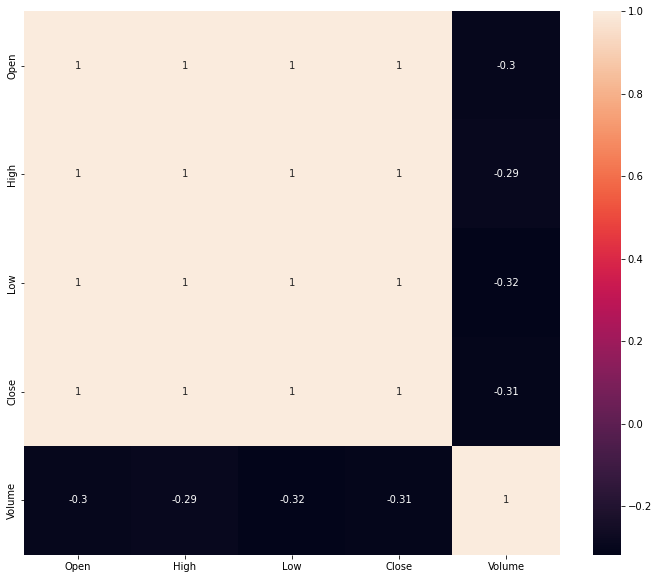

In [5]:
plt.figure(figsize=(12,10))
sns.heatmap(dj.corr(), annot=True)
plt.savefig('./pic/Correlation Pic/Dow Jones/Corr_DJ.png')

In [8]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [9]:
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df

def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [10]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

### Lag the feature based on the order of feature in data.columns
def lag_feature_df(max_lag,data,target):
    # Store each feature's dataframe:
    X = pd.DataFrame()
    X_col = list(data.columns)
    X_col.remove(target)
    feature_range = range(len(X_col))
    for idx,col in enumerate(X_col):
        for j in range(max_lag):
            X[col+'_lag_'+str(j+1)] = data[col].shift(j)
    X[target] = data[target].copy()
    X.dropna(inplace=True)
    return X

In [11]:
df = dj.copy()
df['Close_1'] = df['Close'].shift(-1)
df.dropna(inplace=True)

df_no = dj.copy()
df_no['Close_1'] = dj['Close'].shift(-1)
df_no.dropna(inplace=True)

df_lag = lag_feature_df(30,df,'Close_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)
## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'Close_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'Close_1')
X_test_lag,Y_test_lag = segment(test_lag,'Close_1')

train_no,valid_no,test_no = Train_Valid_Test(df_no.loc[df_lag.index],0.7,0.1,0.2)

## No lagging
X_train_no,Y_train_no = segment(train_no,'Close_1')
X_valid_no,Y_valid_no = segment(test_no,'Close_1')
X_test_no,Y_test_no = segment(test_no,'Close_1')

In [12]:
X_arr = X_train_lag.values

In [13]:
X_train_lag

,Open_lag_1,Open_lag_2,Open_lag_3,Open_lag_4,Open_lag_5,Open_lag_6,Open_lag_7,Open_lag_8,Open_lag_9,Open_lag_10,...,Volume_lag_21,Volume_lag_22,Volume_lag_23,Volume_lag_24,Volume_lag_25,Volume_lag_26,Volume_lag_27,Volume_lag_28,Volume_lag_29,Volume_lag_30
Date,,,,,,,,,,,,,,,,,,,,,
2002-07-25,8185.89,7698.46,7785.55,8015.04,8406.10,8540.47,8476.21,8635.31,8681.28,8805.33,...,407442095.0,295015367.0,341228701.0,416432368.0,276960842.0,248083566.0,212707042.0,247554505.0,287001167.0,227552955.0
2002-07-26,8192.61,8185.89,7698.46,7785.55,8015.04,8406.10,8540.47,8476.21,8635.31,8681.28,...,335305071.0,407442095.0,295015367.0,341228701.0,416432368.0,276960842.0,248083566.0,212707042.0,247554505.0,287001167.0
2002-07-29,8267.99,8192.61,8185.89,7698.46,7785.55,8015.04,8406.10,8540.47,8476.21,8635.31,...,331507251.0,335305071.0,407442095.0,295015367.0,341228701.0,416432368.0,276960842.0,248083566.0,212707042.0,247554505.0
2002-07-30,8707.03,8267.99,8192.61,8185.89,7698.46,7785.55,8015.04,8406.10,8540.47,8476.21,...,258624873.0,331507251.0,335305071.0,407442095.0,295015367.0,341228701.0,416432368.0,276960842.0,248083566.0,212707042.0
2002-07-31,8678.65,8707.03,8267.99,8192.61,8185.89,7698.46,7785.55,8015.04,8406.10,8540.47,...,313840606.0,258624873.0,331507251.0,335305071.0,407442095.0,295015367.0,341228701.0,416432368.0,276960842.0,248083566.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-19,8556.96,8496.73,8504.36,8612.44,8798.50,8770.01,8736.23,8763.66,8764.83,8759.35,...,302220325.0,468600628.0,277679901.0,288268104.0,308898943.0,323857131.0,336988212.0,334781019.0,332640289.0,428362886.0
2009-06-22,8538.52,8556.96,8496.73,8504.36,8612.44,8798.50,8770.01,8736.23,8763.66,8764.83,...,244135230.0,302220325.0,468600628.0,277679901.0,288268104.0,308898943.0,323857131.0,336988212.0,334781019.0,332640289.0
2009-06-23,8340.44,8538.52,8556.96,8496.73,8504.36,8612.44,8798.50,8770.01,8736.23,8763.66,...,314824598.0,244135230.0,302220325.0,468600628.0,277679901.0,288268104.0,308898943.0,323857131.0,336988212.0,334781019.0


In [97]:
X_train_no

,Open,High,Low,Close,Volume
Date,,,,,
2002-07-25,8185.89,8309.39,7945.95,8186.31,442464094
2002-07-26,8192.61,8267.72,8114.59,8264.39,306569629
2002-07-29,8267.99,8711.88,8267.99,8711.88,328767984
2002-07-30,8707.03,8762.14,8540.12,8680.03,332889558
2002-07-31,8678.65,8736.73,8537.10,8736.59,327959940
...,...,...,...,...,...
2009-06-19,8556.96,8616.59,8496.73,8539.73,528747154
2009-06-22,8538.52,8538.83,8334.55,8339.01,291328881
2009-06-23,8340.44,8370.90,8286.41,8322.91,237183440


## Prediction Models

In [14]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [15]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [16]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [17]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [18]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [19]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [20]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

### Raw Data

In [21]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  126.26173331556062 Linear:mae: 89.97359898014803
RandomForest_mae:97.103798
 RandomForest_rmse:134.686068

55/55 [==============================] - 1s 4ms/step - loss: 0.0545
ANN_mae:106.251402
 ANN_rmse:140.050461

XGB rmse:  133.4364147129104 XGB mae: 96.13791324837177
LGB rmse:  135.69797055816372 LGB mae: 98.21247852478398
SVR rmse:  192.05423318005606 SVR mae: 162.4260222697188


In [22]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,126.261733,134.686068,140.050461,133.436415,135.697971,192.054233
mae,89.973599,97.103798,106.251402,96.137913,98.212479,162.426022
mape,0.007708,0.008343,0.009104,0.008256,0.008453,0.013790


### All Lag

In [23]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  141.26339541309937 Linear:mae: 103.9094730875867
RandomForest_mae:99.102477
 RandomForest_rmse:135.947168

55/55 [==============================] - 0s 4ms/step - loss: 0.0798
ANN_mae:263.665946
 ANN_rmse:306.912534

XGB rmse:  140.30449406633406 XGB mae: 102.62079056550604
LGB rmse:  140.78202025449255 LGB mae: 105.48878655718073
SVR rmse:  303.4606574266612 SVR mae: 259.55264521958827


In [24]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,141.263395,135.947168,306.912534,140.304494,140.782020,303.460657
mae,103.909473,99.102477,263.665946,102.620791,105.488787,259.552645
mape,0.008946,0.008529,0.022660,0.008816,0.009077,0.022354


## PACF

In [25]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [26]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [27]:
len(cols)

43

In [28]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  133.31878772818123 Linear:mae: 96.56414403639575
RandomForest_mae:98.544770
 RandomForest_rmse:135.455696

55/55 [==============================] - 1s 4ms/step - loss: 0.0859
ANN_mae:197.788659
 ANN_rmse:234.455359

XGB rmse:  140.6214767145872 XGB mae: 101.99862592372247
LGB rmse:  139.58354329094428 LGB mae: 103.36024867231843
SVR rmse:  267.8951875011863 SVR mae: 233.13687199678273


In [29]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,133.318788,135.455696,234.455359,140.621477,139.583543,267.895188
mae,96.564144,98.544770,197.788659,101.998626,103.360249,233.136872
mape,0.008285,0.008477,0.016980,0.008765,0.008881,0.020104


In [30]:
X_train_no.shape[1]

5

## Feature Selection

### Construct Corr Matrix 

In [31]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150


In [32]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [33]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
0,0.0,0.997088,0.994864,0.993041,0.990770,0.988662,0.986758,0.984851,0.983258,0.981410,...,0.184573,0.183827,0.182217,0.183477,0.183826,0.182216,0.181031,0.180656,0.177814,0.174691
1,0.0,0.000000,0.997088,0.994864,0.993041,0.990770,0.988662,0.986758,0.984851,0.983258,...,0.185043,0.184650,0.184484,0.183401,0.183793,0.183216,0.179839,0.180646,0.180662,0.176878
2,0.0,0.000000,0.000000,0.997088,0.994864,0.993041,0.990770,0.988662,0.986758,0.984851,...,0.185701,0.185117,0.185285,0.185617,0.183715,0.183199,0.180889,0.179468,0.180651,0.179749
3,0.0,0.000000,0.000000,0.000000,0.997088,0.994864,0.993041,0.990770,0.988662,0.986758,...,0.187094,0.185762,0.185692,0.186285,0.185933,0.183157,0.180955,0.180551,0.179468,0.179795
4,0.0,0.000000,0.000000,0.000000,0.000000,0.997088,0.994864,0.993041,0.990770,0.988662,...,0.188643,0.187140,0.186239,0.186491,0.186576,0.185449,0.181193,0.180672,0.180547,0.178727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.630881,0.555650,0.499739,0.438768
146,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.630881,0.555650,0.499739
147,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.630881,0.555650
148,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.630881


In [34]:
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [35]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    # Check how many features are highly correlated with 1 feature
    correlated_pairs_dict = {}

    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    corr_cols = X_train.columns[high_correlated_features]
    
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    ### Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [41]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
for i in np.round(arange(0.99,0.999,0.001),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.99
High_correlated_features 120
MRMR Features 4
Final Features: 34
0.991
High_correlated_features 120
MRMR Features 5
Final Features: 34
0.992
High_correlated_features 120
MRMR Features 5
Final Features: 35
0.993
High_correlated_features 120
MRMR Features 5
Final Features: 35
0.994
High_correlated_features 120
MRMR Features 6
Final Features: 36
0.995
High_correlated_features 120
MRMR Features 10
Final Features: 40
0.996
High_correlated_features 120
MRMR Features 10
Final Features: 40
0.997
High_correlated_features 120
MRMR Features 10
Final Features: 40
0.998
High_correlated_features 120
MRMR Features 30
Final Features: 56
0.999
High_correlated_features 58
MRMR Features 29
Final Features: 121


In [42]:
for k,v in feature_collections.items():
    print(k,len(v))

0.99 34
0.991 34
0.992 35
0.993 35
0.994 36
0.995 40
0.996 40
0.997 40
0.998 56
0.999 121


In [43]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [44]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [45]:
features_compare

,High correlated Features,MRMR,Final Features
0.990,120,4,34
0.991,120,5,34
0.992,120,5,35
0.993,120,5,35
0.994,120,6,36
0.995,120,10,40
0.996,120,10,40
0.997,120,10,40
0.998,120,30,56
0.999,58,29,121


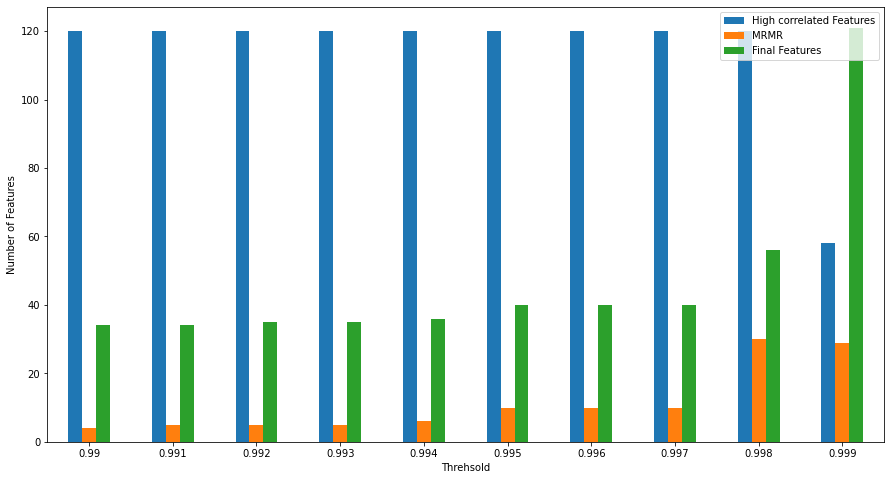

In [118]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/Dow Jones/feature_reduction_DJ.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [47]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [48]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/Electricity/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

In [49]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [50]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [51]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [52]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [53]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,5,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.0485743
[2]	valid_0's l2: 0.0395569
[3]	valid_0's l2: 0.032242
[4]	valid_0's l2: 0.0263084
[5]	valid_0's l2: 0.0215471
[6]	valid_0's l2: 0.0176894
[7]	valid_0's l2: 0.0145749
[8]	valid_0's l2: 0.0120311
[9]	valid_0's l2: 0.00997946
[10]	valid_0's l2: 0.00832066
[11]	valid_0's l2: 0.00696962
[12]	valid_0's l2: 0.00589235
[13]	valid_0's l2: 0.00500704
[14]	valid_0's l2: 0.00430282
[15]	valid_0's l2: 0.00372838
[16]	valid_0's l2: 0.00326291
[17]	valid_0's l2: 0.00290014
[18]	valid_0's l2: 0.002607
[19]	valid_0's l2: 0.00235782
[20]	valid_0's l2: 0.00217068
[21]	valid_0's l2: 0.00201201
[22]	valid_0's l2: 0.00187655
[23]	valid_0's l2: 0.00177338
[24]	valid_0's l2: 0.0016908
[25]	valid_0's l2: 0.00162081
[26]	valid_0's l2: 0.00157248
[27]	valid_0's l2: 0.0015282
[28]	valid_0's l2: 0.00149103
[29]	valid_0's l2: 0.00146108
[30]	valid_0's l2: 0.00143652
[31]	valid_0's l2: 0.00141982
[32]	valid_0's l2: 0.00141057
[33]	valid_0's l2: 0.00140458
[34]	valid_0's l2: 0.00139548
[3

[44]	valid_0's l2: 0.00136106
[45]	valid_0's l2: 0.00136297
[46]	valid_0's l2: 0.00136335
[47]	valid_0's l2: 0.00136401
[48]	valid_0's l2: 0.00136355
[49]	valid_0's l2: 0.00136654
[50]	valid_0's l2: 0.00136477
[51]	valid_0's l2: 0.00136515
[52]	valid_0's l2: 0.00136799
[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395525
[3]	valid_0's l2: 0.0322368
[4]	valid_0's l2: 0.0263029
[5]	valid_0's l2: 0.0215421
[6]	valid_0's l2: 0.0177008
[7]	valid_0's l2: 0.0145714
[8]	valid_0's l2: 0.0120346
[9]	valid_0's l2: 0.00998021
[10]	valid_0's l2: 0.00831281
[11]	valid_0's l2: 0.00696636
[12]	valid_0's l2: 0.00588429
[13]	valid_0's l2: 0.00500314
[14]	valid_0's l2: 0.00429679
[15]	valid_0's l2: 0.003715
[16]	valid_0's l2: 0.0032553
[17]	valid_0's l2: 0.00288083
[18]	valid_0's l2: 0.0025821
[19]	valid_0's l2: 0.00234365
[20]	valid_0's l2: 0.00214878
[21]	valid_0's l2: 0.00199641
[22]	valid_0's l2: 0.00187027
[23]	valid_0's l2: 0.00177351
[24]	valid_0's l2: 0.00168937
[25]	valid_0's l2: 0.00162573
[26

[2]	valid_0's l2: 0.039559
[3]	valid_0's l2: 0.032242
[4]	valid_0's l2: 0.026304
[5]	valid_0's l2: 0.021545
[6]	valid_0's l2: 0.0177035
[7]	valid_0's l2: 0.0145713
[8]	valid_0's l2: 0.012022
[9]	valid_0's l2: 0.00996872
[10]	valid_0's l2: 0.0083194
[11]	valid_0's l2: 0.00697092
[12]	valid_0's l2: 0.00587313
[13]	valid_0's l2: 0.00499248
[14]	valid_0's l2: 0.00428855
[15]	valid_0's l2: 0.0037138
[16]	valid_0's l2: 0.00325325
[17]	valid_0's l2: 0.00288378
[18]	valid_0's l2: 0.00257326
[19]	valid_0's l2: 0.00233233
[20]	valid_0's l2: 0.00214866
[21]	valid_0's l2: 0.00199699
[22]	valid_0's l2: 0.00187895
[23]	valid_0's l2: 0.0017699
[24]	valid_0's l2: 0.00168401
[25]	valid_0's l2: 0.0016212
[26]	valid_0's l2: 0.00156861
[27]	valid_0's l2: 0.00152426
[28]	valid_0's l2: 0.00149196
[29]	valid_0's l2: 0.00146268
[30]	valid_0's l2: 0.00143669
[31]	valid_0's l2: 0.0014216
[32]	valid_0's l2: 0.0014088
[33]	valid_0's l2: 0.00139797
[34]	valid_0's l2: 0.00138716
[35]	valid_0's l2: 0.00137985
[36]	v

[10]	valid_0's l2: 0.0603783
[11]	valid_0's l2: 0.060203
[12]	valid_0's l2: 0.0601717
[1]	valid_0's l2: 0.0485743
[2]	valid_0's l2: 0.0395569
[3]	valid_0's l2: 0.032242
[4]	valid_0's l2: 0.0263084
[5]	valid_0's l2: 0.0215471
[6]	valid_0's l2: 0.0176894
[7]	valid_0's l2: 0.0145749
[8]	valid_0's l2: 0.0120311
[9]	valid_0's l2: 0.00997946
[10]	valid_0's l2: 0.00832066
[11]	valid_0's l2: 0.00696962
[12]	valid_0's l2: 0.00589235
[13]	valid_0's l2: 0.00500704
[14]	valid_0's l2: 0.00430282
[15]	valid_0's l2: 0.00372838
[16]	valid_0's l2: 0.00326291
[17]	valid_0's l2: 0.00290014
[18]	valid_0's l2: 0.002607
[19]	valid_0's l2: 0.00235782
[20]	valid_0's l2: 0.00217068
[21]	valid_0's l2: 0.00201201
[22]	valid_0's l2: 0.00187655
[23]	valid_0's l2: 0.00177338
[24]	valid_0's l2: 0.0016908
[25]	valid_0's l2: 0.00162081
[26]	valid_0's l2: 0.00157248
[27]	valid_0's l2: 0.0015282
[28]	valid_0's l2: 0.00149103
[29]	valid_0's l2: 0.00146108
[30]	valid_0's l2: 0.00143652
[31]	valid_0's l2: 0.00141982
[32]	v

[2]	valid_0's l2: 0.0395585
[3]	valid_0's l2: 0.032247
[4]	valid_0's l2: 0.0263284
[5]	valid_0's l2: 0.0215546
[6]	valid_0's l2: 0.0176928
[7]	valid_0's l2: 0.014544
[8]	valid_0's l2: 0.0120272
[9]	valid_0's l2: 0.00996844
[10]	valid_0's l2: 0.00831535
[11]	valid_0's l2: 0.00697447
[12]	valid_0's l2: 0.00589026
[13]	valid_0's l2: 0.00502879
[14]	valid_0's l2: 0.00432683
[15]	valid_0's l2: 0.00377152
[16]	valid_0's l2: 0.00329818
[17]	valid_0's l2: 0.00293873
[18]	valid_0's l2: 0.00264088
[19]	valid_0's l2: 0.00239812
[20]	valid_0's l2: 0.00219165
[21]	valid_0's l2: 0.00202849
[22]	valid_0's l2: 0.00189309
[23]	valid_0's l2: 0.00178774
[24]	valid_0's l2: 0.00170666
[25]	valid_0's l2: 0.00163758
[26]	valid_0's l2: 0.0015815
[27]	valid_0's l2: 0.00153882
[28]	valid_0's l2: 0.00150323
[29]	valid_0's l2: 0.00147549
[30]	valid_0's l2: 0.00145864
[31]	valid_0's l2: 0.0014341
[32]	valid_0's l2: 0.00141889
[33]	valid_0's l2: 0.0014042
[34]	valid_0's l2: 0.001398
[35]	valid_0's l2: 0.00139124
[3

[23]	valid_0's l2: 0.00178116
[24]	valid_0's l2: 0.00169105
[25]	valid_0's l2: 0.00163022
[26]	valid_0's l2: 0.00158195
[27]	valid_0's l2: 0.00154212
[28]	valid_0's l2: 0.00151121
[29]	valid_0's l2: 0.00148148
[30]	valid_0's l2: 0.00145984
[31]	valid_0's l2: 0.00144118
[32]	valid_0's l2: 0.00142592
[33]	valid_0's l2: 0.00141531
[34]	valid_0's l2: 0.00140679
[35]	valid_0's l2: 0.00139886
[36]	valid_0's l2: 0.00138984
[37]	valid_0's l2: 0.00139061
[38]	valid_0's l2: 0.00138841
[39]	valid_0's l2: 0.00138436
[40]	valid_0's l2: 0.0013862
[41]	valid_0's l2: 0.00137894
[42]	valid_0's l2: 0.00137818
[43]	valid_0's l2: 0.00138066
[44]	valid_0's l2: 0.00137779
[45]	valid_0's l2: 0.00137959
[46]	valid_0's l2: 0.00138137
[47]	valid_0's l2: 0.00138154
[48]	valid_0's l2: 0.00138277
[49]	valid_0's l2: 0.00138375
[50]	valid_0's l2: 0.00138521
[51]	valid_0's l2: 0.00138367
[52]	valid_0's l2: 0.00137842
[53]	valid_0's l2: 0.00138263
[54]	valid_0's l2: 0.00138283
[1]	valid_0's l2: 0.04857
[2]	valid_0's l

[46]	valid_0's l2: 0.00133917
[47]	valid_0's l2: 0.00134159
[48]	valid_0's l2: 0.00134215
[49]	valid_0's l2: 0.00134226
[50]	valid_0's l2: 0.001342
[51]	valid_0's l2: 0.00134337
[52]	valid_0's l2: 0.00134564
[53]	valid_0's l2: 0.00134693
[54]	valid_0's l2: 0.00134744
[55]	valid_0's l2: 0.00134235
[56]	valid_0's l2: 0.00134346
[1]	valid_0's l2: 0.0590173
[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0.0591886
[4]	valid_0's l2: 0.0592727
[5]	valid_0's l2: 0.0594912
[6]	valid_0's l2: 0.0595755
[7]	valid_0's l2: 0.0596274
[8]	valid_0's l2: 0.0599186
[9]	valid_0's l2: 0.060065
[10]	valid_0's l2: 0.0603783
[11]	valid_0's l2: 0.060203
[12]	valid_0's l2: 0.0601717
[1]	valid_0's l2: 0.0485743
[2]	valid_0's l2: 0.0395585
[3]	valid_0's l2: 0.032247
[4]	valid_0's l2: 0.0263284
[5]	valid_0's l2: 0.0215546
[6]	valid_0's l2: 0.0176922
[7]	valid_0's l2: 0.0145435
[8]	valid_0's l2: 0.0120278
[9]	valid_0's l2: 0.00996952
[10]	valid_0's l2: 0.00831629
[11]	valid_0's l2: 0.00697466
[12]	valid_0's l2: 0.00

[32]	valid_0's l2: 0.00140132
[33]	valid_0's l2: 0.00138693
[34]	valid_0's l2: 0.0013772
[35]	valid_0's l2: 0.00136899
[36]	valid_0's l2: 0.00136131
[37]	valid_0's l2: 0.0013546
[38]	valid_0's l2: 0.00134674
[39]	valid_0's l2: 0.00134539
[40]	valid_0's l2: 0.00134455
[41]	valid_0's l2: 0.00134091
[42]	valid_0's l2: 0.00133951
[43]	valid_0's l2: 0.00133829
[44]	valid_0's l2: 0.0013349
[45]	valid_0's l2: 0.00133334
[46]	valid_0's l2: 0.00133634
[47]	valid_0's l2: 0.00133582
[48]	valid_0's l2: 0.00133234
[49]	valid_0's l2: 0.00133386
[50]	valid_0's l2: 0.0013336
[51]	valid_0's l2: 0.00133528
[52]	valid_0's l2: 0.00133559
[53]	valid_0's l2: 0.0013354
[54]	valid_0's l2: 0.00133577
[55]	valid_0's l2: 0.0013343
[56]	valid_0's l2: 0.00133402
[57]	valid_0's l2: 0.00133366
[58]	valid_0's l2: 0.00133422
[1]	valid_0's l2: 0.0485743
[2]	valid_0's l2: 0.0395585
[3]	valid_0's l2: 0.032247
[4]	valid_0's l2: 0.0263284
[5]	valid_0's l2: 0.0215546
[6]	valid_0's l2: 0.0176928
[7]	valid_0's l2: 0.014544
[8

[33]	valid_0's l2: 0.00136536
[34]	valid_0's l2: 0.00135697
[35]	valid_0's l2: 0.00134868
[36]	valid_0's l2: 0.0013446
[37]	valid_0's l2: 0.00134124
[38]	valid_0's l2: 0.00134221
[39]	valid_0's l2: 0.00133692
[40]	valid_0's l2: 0.0013325
[41]	valid_0's l2: 0.00132906
[42]	valid_0's l2: 0.00132272
[43]	valid_0's l2: 0.0013238
[44]	valid_0's l2: 0.00132421
[45]	valid_0's l2: 0.00132269
[46]	valid_0's l2: 0.00132138
[47]	valid_0's l2: 0.0013237
[48]	valid_0's l2: 0.00132734
[49]	valid_0's l2: 0.00132731
[50]	valid_0's l2: 0.00132625
[51]	valid_0's l2: 0.001326
[52]	valid_0's l2: 0.00132879
[53]	valid_0's l2: 0.00133148
[54]	valid_0's l2: 0.00133005
[55]	valid_0's l2: 0.00132804
[56]	valid_0's l2: 0.00132948
[1]	valid_0's l2: 0.0485544
[2]	valid_0's l2: 0.0395453
[3]	valid_0's l2: 0.0322317
[4]	valid_0's l2: 0.0262979
[5]	valid_0's l2: 0.0215345
[6]	valid_0's l2: 0.017679
[7]	valid_0's l2: 0.0145472
[8]	valid_0's l2: 0.012004
[9]	valid_0's l2: 0.00994956
[10]	valid_0's l2: 0.00831267
[11]	

[36]	valid_0's l2: 0.00133586
[37]	valid_0's l2: 0.00133254
[38]	valid_0's l2: 0.00133006
[39]	valid_0's l2: 0.00132419
[40]	valid_0's l2: 0.0013198
[41]	valid_0's l2: 0.00131957
[42]	valid_0's l2: 0.00131428
[43]	valid_0's l2: 0.00131136
[44]	valid_0's l2: 0.00130621
[45]	valid_0's l2: 0.00130817
[46]	valid_0's l2: 0.0013092
[47]	valid_0's l2: 0.00130821
[48]	valid_0's l2: 0.0013115
[49]	valid_0's l2: 0.00131385
[50]	valid_0's l2: 0.00131265
[51]	valid_0's l2: 0.00131416
[52]	valid_0's l2: 0.00130858
[53]	valid_0's l2: 0.00130731
[54]	valid_0's l2: 0.00130936
[1]	valid_0's l2: 0.0485544
[2]	valid_0's l2: 0.0395453
[3]	valid_0's l2: 0.03223
[4]	valid_0's l2: 0.0262935
[5]	valid_0's l2: 0.0215351
[6]	valid_0's l2: 0.017679
[7]	valid_0's l2: 0.0145427
[8]	valid_0's l2: 0.0119984
[9]	valid_0's l2: 0.00993434
[10]	valid_0's l2: 0.00827143
[11]	valid_0's l2: 0.0069375
[12]	valid_0's l2: 0.00585023
[13]	valid_0's l2: 0.00496347
[14]	valid_0's l2: 0.00425288
[15]	valid_0's l2: 0.00368396
[16]

[40]	valid_0's l2: 0.0013346
[41]	valid_0's l2: 0.00133415
[42]	valid_0's l2: 0.00133109
[43]	valid_0's l2: 0.00133368
[44]	valid_0's l2: 0.00133573
[45]	valid_0's l2: 0.00133456
[46]	valid_0's l2: 0.00133646
[47]	valid_0's l2: 0.00133823
[48]	valid_0's l2: 0.00133571
[49]	valid_0's l2: 0.0013355
[50]	valid_0's l2: 0.00133687
[51]	valid_0's l2: 0.00133659
[52]	valid_0's l2: 0.00133541
[1]	valid_0's l2: 0.0590173
[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0.0591886
[4]	valid_0's l2: 0.0592727
[5]	valid_0's l2: 0.0594912
[6]	valid_0's l2: 0.0595755
[7]	valid_0's l2: 0.0596274
[8]	valid_0's l2: 0.0599186
[9]	valid_0's l2: 0.060065
[10]	valid_0's l2: 0.0603783
[11]	valid_0's l2: 0.060203
[12]	valid_0's l2: 0.0601717
[1]	valid_0's l2: 0.0485586
[2]	valid_0's l2: 0.039555
[3]	valid_0's l2: 0.0322405
[4]	valid_0's l2: 0.0263064
[5]	valid_0's l2: 0.021542
[6]	valid_0's l2: 0.0176828
[7]	valid_0's l2: 0.0145559
[8]	valid_0's l2: 0.0120006
[9]	valid_0's l2: 0.0099483
[10]	valid_0's l2: 0.0082

[47]	valid_0's l2: 0.00135317
[1]	valid_0's l2: 0.0485586
[2]	valid_0's l2: 0.039555
[3]	valid_0's l2: 0.0322405
[4]	valid_0's l2: 0.0263064
[5]	valid_0's l2: 0.021542
[6]	valid_0's l2: 0.0176819
[7]	valid_0's l2: 0.0145517
[8]	valid_0's l2: 0.0120089
[9]	valid_0's l2: 0.00994917
[10]	valid_0's l2: 0.00830723
[11]	valid_0's l2: 0.0069569
[12]	valid_0's l2: 0.00587051
[13]	valid_0's l2: 0.00498144
[14]	valid_0's l2: 0.00426787
[15]	valid_0's l2: 0.00369592
[16]	valid_0's l2: 0.00322952
[17]	valid_0's l2: 0.00287599
[18]	valid_0's l2: 0.00257648
[19]	valid_0's l2: 0.00234063
[20]	valid_0's l2: 0.00213635
[21]	valid_0's l2: 0.00198144
[22]	valid_0's l2: 0.00185424
[23]	valid_0's l2: 0.00175542
[24]	valid_0's l2: 0.00166885
[25]	valid_0's l2: 0.00160258
[26]	valid_0's l2: 0.00154935
[27]	valid_0's l2: 0.00150861
[28]	valid_0's l2: 0.00146751
[29]	valid_0's l2: 0.00143191
[30]	valid_0's l2: 0.00141259
[31]	valid_0's l2: 0.00139456
[32]	valid_0's l2: 0.0013787
[33]	valid_0's l2: 0.00136536
[

[46]	valid_0's l2: 0.00131823
[47]	valid_0's l2: 0.00131836
[48]	valid_0's l2: 0.00131648
[49]	valid_0's l2: 0.00131601
[50]	valid_0's l2: 0.00131501
[51]	valid_0's l2: 0.00131218
[52]	valid_0's l2: 0.00131433
[53]	valid_0's l2: 0.00131414
[54]	valid_0's l2: 0.00131887
[55]	valid_0's l2: 0.0013197
[56]	valid_0's l2: 0.00132131
[57]	valid_0's l2: 0.00131981
[58]	valid_0's l2: 0.0013203
[59]	valid_0's l2: 0.00132396
[60]	valid_0's l2: 0.00132456
[61]	valid_0's l2: 0.00132142
[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395542
[3]	valid_0's l2: 0.0322414
[4]	valid_0's l2: 0.0263232
[5]	valid_0's l2: 0.0215612
[6]	valid_0's l2: 0.01768
[7]	valid_0's l2: 0.0145309
[8]	valid_0's l2: 0.0119944
[9]	valid_0's l2: 0.00994838
[10]	valid_0's l2: 0.0082692
[11]	valid_0's l2: 0.00692583
[12]	valid_0's l2: 0.00584603
[13]	valid_0's l2: 0.00497179
[14]	valid_0's l2: 0.00426766
[15]	valid_0's l2: 0.00371343
[16]	valid_0's l2: 0.00326214
[17]	valid_0's l2: 0.002897
[18]	valid_0's l2: 0.00258576
[19]	v

[58]	valid_0's l2: 0.0013203
[59]	valid_0's l2: 0.00132396
[60]	valid_0's l2: 0.00132456
[61]	valid_0's l2: 0.00132142
[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395542
[3]	valid_0's l2: 0.0322414
[4]	valid_0's l2: 0.0263232
[5]	valid_0's l2: 0.0215612
[6]	valid_0's l2: 0.01768
[7]	valid_0's l2: 0.0145309
[8]	valid_0's l2: 0.0119944
[9]	valid_0's l2: 0.00994838
[10]	valid_0's l2: 0.0082692
[11]	valid_0's l2: 0.00692583
[12]	valid_0's l2: 0.00584603
[13]	valid_0's l2: 0.00497179
[14]	valid_0's l2: 0.00426766
[15]	valid_0's l2: 0.00371343
[16]	valid_0's l2: 0.00326214
[17]	valid_0's l2: 0.002897
[18]	valid_0's l2: 0.00258576
[19]	valid_0's l2: 0.00233642
[20]	valid_0's l2: 0.00215116
[21]	valid_0's l2: 0.00197869
[22]	valid_0's l2: 0.00183928
[23]	valid_0's l2: 0.00173362
[24]	valid_0's l2: 0.00164473
[25]	valid_0's l2: 0.00157432
[26]	valid_0's l2: 0.00151764
[27]	valid_0's l2: 0.00147439
[28]	valid_0's l2: 0.00144264
[29]	valid_0's l2: 0.00141129
[30]	valid_0's l2: 0.00139274
[31]	

[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395542
[3]	valid_0's l2: 0.0322414
[4]	valid_0's l2: 0.0263232
[5]	valid_0's l2: 0.0215612
[6]	valid_0's l2: 0.01768
[7]	valid_0's l2: 0.0145309
[8]	valid_0's l2: 0.0119944
[9]	valid_0's l2: 0.00994838
[10]	valid_0's l2: 0.0082692
[11]	valid_0's l2: 0.00692583
[12]	valid_0's l2: 0.00584603
[13]	valid_0's l2: 0.00497179
[14]	valid_0's l2: 0.00426766
[15]	valid_0's l2: 0.00371343
[16]	valid_0's l2: 0.00326214
[17]	valid_0's l2: 0.002897
[18]	valid_0's l2: 0.00258576
[19]	valid_0's l2: 0.00233642
[20]	valid_0's l2: 0.00215116
[21]	valid_0's l2: 0.00197869
[22]	valid_0's l2: 0.00183928
[23]	valid_0's l2: 0.00173362
[24]	valid_0's l2: 0.00164473
[25]	valid_0's l2: 0.00157432
[26]	valid_0's l2: 0.00151764
[27]	valid_0's l2: 0.00147439
[28]	valid_0's l2: 0.00144264
[29]	valid_0's l2: 0.00141129
[30]	valid_0's l2: 0.00139274
[31]	valid_0's l2: 0.00137865
[32]	valid_0's l2: 0.00137091
[33]	valid_0's l2: 0.00135753
[34]	valid_0's l2: 0.00135372
[35]

[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395542
[3]	valid_0's l2: 0.0322414
[4]	valid_0's l2: 0.0263232
[5]	valid_0's l2: 0.0215612
[6]	valid_0's l2: 0.01768
[7]	valid_0's l2: 0.0145309
[8]	valid_0's l2: 0.0119944
[9]	valid_0's l2: 0.00994838
[10]	valid_0's l2: 0.0082692
[11]	valid_0's l2: 0.00692583
[12]	valid_0's l2: 0.00584603
[13]	valid_0's l2: 0.00497179
[14]	valid_0's l2: 0.00426766
[15]	valid_0's l2: 0.00371343
[16]	valid_0's l2: 0.00326214
[17]	valid_0's l2: 0.002897
[18]	valid_0's l2: 0.00258576
[19]	valid_0's l2: 0.00233642
[20]	valid_0's l2: 0.00215116
[21]	valid_0's l2: 0.00197869
[22]	valid_0's l2: 0.00183928
[23]	valid_0's l2: 0.00173362
[24]	valid_0's l2: 0.00164473
[25]	valid_0's l2: 0.00157432
[26]	valid_0's l2: 0.00151764
[27]	valid_0's l2: 0.00147439
[28]	valid_0's l2: 0.00144264
[29]	valid_0's l2: 0.00141129
[30]	valid_0's l2: 0.00139274
[31]	valid_0's l2: 0.00137865
[32]	valid_0's l2: 0.00137091
[33]	valid_0's l2: 0.00135753
[34]	valid_0's l2: 0.00135372
[35]

[21]	valid_0's l2: 0.00197869
[22]	valid_0's l2: 0.00183928
[23]	valid_0's l2: 0.00173362
[24]	valid_0's l2: 0.00164473
[25]	valid_0's l2: 0.00157432
[26]	valid_0's l2: 0.00151764
[27]	valid_0's l2: 0.00147439
[28]	valid_0's l2: 0.00144264
[29]	valid_0's l2: 0.00141129
[30]	valid_0's l2: 0.00139274
[31]	valid_0's l2: 0.00137865
[32]	valid_0's l2: 0.00137091
[33]	valid_0's l2: 0.00135753
[34]	valid_0's l2: 0.00135372
[35]	valid_0's l2: 0.0013468
[36]	valid_0's l2: 0.00134203
[37]	valid_0's l2: 0.001337
[38]	valid_0's l2: 0.00133608
[39]	valid_0's l2: 0.00133208
[40]	valid_0's l2: 0.00133149
[41]	valid_0's l2: 0.0013335
[42]	valid_0's l2: 0.00133406
[43]	valid_0's l2: 0.00132862
[44]	valid_0's l2: 0.001327
[45]	valid_0's l2: 0.00132343
[46]	valid_0's l2: 0.00132458
[47]	valid_0's l2: 0.00132503
[48]	valid_0's l2: 0.00132105
[49]	valid_0's l2: 0.00131647
[50]	valid_0's l2: 0.00131822
[51]	valid_0's l2: 0.00131774
[52]	valid_0's l2: 0.00131407
[53]	valid_0's l2: 0.00131272
[54]	valid_0's l

[2]	valid_0's l2: 0.0395556
[3]	valid_0's l2: 0.0322621
[4]	valid_0's l2: 0.0263364
[5]	valid_0's l2: 0.0215578
[6]	valid_0's l2: 0.017682
[7]	valid_0's l2: 0.0145436
[8]	valid_0's l2: 0.012009
[9]	valid_0's l2: 0.00995893
[10]	valid_0's l2: 0.00829297
[11]	valid_0's l2: 0.0069438
[12]	valid_0's l2: 0.00584819
[13]	valid_0's l2: 0.00496065
[14]	valid_0's l2: 0.0042484
[15]	valid_0's l2: 0.00367222
[16]	valid_0's l2: 0.00320346
[17]	valid_0's l2: 0.00282967
[18]	valid_0's l2: 0.00251598
[19]	valid_0's l2: 0.00227962
[20]	valid_0's l2: 0.00208031
[21]	valid_0's l2: 0.00191398
[22]	valid_0's l2: 0.00178085
[23]	valid_0's l2: 0.00167256
[24]	valid_0's l2: 0.00158841
[25]	valid_0's l2: 0.00152988
[26]	valid_0's l2: 0.00147935
[27]	valid_0's l2: 0.00143695
[28]	valid_0's l2: 0.0014026
[29]	valid_0's l2: 0.00137429
[30]	valid_0's l2: 0.00135269
[31]	valid_0's l2: 0.001339
[32]	valid_0's l2: 0.00132893
[33]	valid_0's l2: 0.00131982
[34]	valid_0's l2: 0.0013087
[35]	valid_0's l2: 0.00130169
[36

[34]	valid_0's l2: 0.0013087
[35]	valid_0's l2: 0.00130169
[36]	valid_0's l2: 0.0012942
[37]	valid_0's l2: 0.00128836
[38]	valid_0's l2: 0.00128736
[39]	valid_0's l2: 0.00128402
[40]	valid_0's l2: 0.001276
[41]	valid_0's l2: 0.00127723
[42]	valid_0's l2: 0.00127369
[43]	valid_0's l2: 0.00127344
[44]	valid_0's l2: 0.00127583
[45]	valid_0's l2: 0.00127833
[46]	valid_0's l2: 0.00127532
[47]	valid_0's l2: 0.00127667
[48]	valid_0's l2: 0.0012743
[49]	valid_0's l2: 0.001275
[50]	valid_0's l2: 0.00127247
[51]	valid_0's l2: 0.00127142
[52]	valid_0's l2: 0.00127528
[53]	valid_0's l2: 0.00127587
[54]	valid_0's l2: 0.00127483
[55]	valid_0's l2: 0.00127699
[56]	valid_0's l2: 0.00127891
[57]	valid_0's l2: 0.00127901
[58]	valid_0's l2: 0.0012776
[59]	valid_0's l2: 0.00127921
[60]	valid_0's l2: 0.00127846
[61]	valid_0's l2: 0.00128223
[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158


[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[1]	valid_0's l2: 0.0485709
[2]	valid_0's l2: 0.0395553
[3]	valid_0's l2: 0.0322642
[4]	valid_0's l2: 0.0263407
[5]	valid_0's l2: 0.0215682
[6]	valid_0's l2: 0.017694
[7]	valid_0's l2: 0.0145791
[8]	valid_0's l2: 0.0120354
[9]	valid_0's l2: 0.00999309
[10]	valid_0's l2: 0.00832655
[11]	valid_0's l2: 0.00698255
[12]	valid_0's l2: 0.00587193
[13]	valid_0's l2: 0.00500015
[14]	valid_0's l2: 0.00427106
[15]	valid_0's l2: 0.00369207
[16]	valid_0's l2: 0.00323676
[17]	valid_0's l2: 0.00285425
[18]	valid_0's l2: 0.00254886
[19]	valid_0's l2: 0.00231454
[20]	valid_0's l2: 0.00212131
[21]	valid_0's l2: 0.00195895
[22]	valid_0's l2: 0

[20]	valid_0's l2: 0.00212131
[21]	valid_0's l2: 0.00195895
[22]	valid_0's l2: 0.00182524
[23]	valid_0's l2: 0.00172309
[24]	valid_0's l2: 0.00164615
[25]	valid_0's l2: 0.00157956
[26]	valid_0's l2: 0.00152309
[27]	valid_0's l2: 0.00147412
[28]	valid_0's l2: 0.0014424
[29]	valid_0's l2: 0.00141544
[30]	valid_0's l2: 0.00139158
[31]	valid_0's l2: 0.00137345
[32]	valid_0's l2: 0.00135473
[33]	valid_0's l2: 0.00134225
[34]	valid_0's l2: 0.00133613
[35]	valid_0's l2: 0.00133217
[36]	valid_0's l2: 0.0013324
[37]	valid_0's l2: 0.00132543
[38]	valid_0's l2: 0.00132459
[39]	valid_0's l2: 0.00131987
[40]	valid_0's l2: 0.00131531
[41]	valid_0's l2: 0.00131563
[42]	valid_0's l2: 0.0013097
[43]	valid_0's l2: 0.00131165
[44]	valid_0's l2: 0.00130752
[45]	valid_0's l2: 0.00130746
[46]	valid_0's l2: 0.00130503
[47]	valid_0's l2: 0.00130207
[48]	valid_0's l2: 0.00130024
[49]	valid_0's l2: 0.0012974
[50]	valid_0's l2: 0.00129697
[51]	valid_0's l2: 0.00129595
[52]	valid_0's l2: 0.00129614
[53]	valid_0's

[1]	valid_0's l2: 0.0485777
[2]	valid_0's l2: 0.0396054
[3]	valid_0's l2: 0.0323367
[4]	valid_0's l2: 0.0264261
[5]	valid_0's l2: 0.0217009
[6]	valid_0's l2: 0.0178322
[7]	valid_0's l2: 0.0147243
[8]	valid_0's l2: 0.0121629
[9]	valid_0's l2: 0.0101317
[10]	valid_0's l2: 0.00848671
[11]	valid_0's l2: 0.00717166
[12]	valid_0's l2: 0.00607076
[13]	valid_0's l2: 0.00520107
[14]	valid_0's l2: 0.00449312
[15]	valid_0's l2: 0.00391159
[16]	valid_0's l2: 0.00345311
[17]	valid_0's l2: 0.0030623
[18]	valid_0's l2: 0.00275019
[19]	valid_0's l2: 0.00250732
[20]	valid_0's l2: 0.00230955
[21]	valid_0's l2: 0.00213941
[22]	valid_0's l2: 0.00200874
[23]	valid_0's l2: 0.00189368
[24]	valid_0's l2: 0.00181473
[25]	valid_0's l2: 0.00173626
[26]	valid_0's l2: 0.0016783
[27]	valid_0's l2: 0.00163263
[28]	valid_0's l2: 0.00159491
[29]	valid_0's l2: 0.0015671
[30]	valid_0's l2: 0.00154396
[31]	valid_0's l2: 0.0015262
[32]	valid_0's l2: 0.00151269
[33]	valid_0's l2: 0.00149356
[34]	valid_0's l2: 0.00148497
[3

[2]	valid_0's l2: 0.0396063
[3]	valid_0's l2: 0.0323281
[4]	valid_0's l2: 0.0264189
[5]	valid_0's l2: 0.0216819
[6]	valid_0's l2: 0.0178089
[7]	valid_0's l2: 0.0147236
[8]	valid_0's l2: 0.0121671
[9]	valid_0's l2: 0.0101325
[10]	valid_0's l2: 0.00848665
[11]	valid_0's l2: 0.00714292
[12]	valid_0's l2: 0.00604978
[13]	valid_0's l2: 0.00518027
[14]	valid_0's l2: 0.0044689
[15]	valid_0's l2: 0.00388574
[16]	valid_0's l2: 0.00341528
[17]	valid_0's l2: 0.00304185
[18]	valid_0's l2: 0.00273534
[19]	valid_0's l2: 0.00248848
[20]	valid_0's l2: 0.00229188
[21]	valid_0's l2: 0.00213747
[22]	valid_0's l2: 0.00200321
[23]	valid_0's l2: 0.00191114
[24]	valid_0's l2: 0.00182959
[25]	valid_0's l2: 0.00175328
[26]	valid_0's l2: 0.00169983
[27]	valid_0's l2: 0.00165028
[28]	valid_0's l2: 0.00160399
[29]	valid_0's l2: 0.00157773
[30]	valid_0's l2: 0.00155961
[31]	valid_0's l2: 0.00153794
[32]	valid_0's l2: 0.00152855
[33]	valid_0's l2: 0.00151535
[34]	valid_0's l2: 0.00150989
[35]	valid_0's l2: 0.001499

[32]	valid_0's l2: 0.00152855
[33]	valid_0's l2: 0.00151535
[34]	valid_0's l2: 0.00150989
[35]	valid_0's l2: 0.00149995
[36]	valid_0's l2: 0.00149157
[37]	valid_0's l2: 0.00148204
[38]	valid_0's l2: 0.0014779
[39]	valid_0's l2: 0.00147622
[40]	valid_0's l2: 0.00147655
[41]	valid_0's l2: 0.00147737
[42]	valid_0's l2: 0.00147011
[43]	valid_0's l2: 0.00146986
[44]	valid_0's l2: 0.00146757
[45]	valid_0's l2: 0.00146298
[46]	valid_0's l2: 0.00146256
[47]	valid_0's l2: 0.00146037
[48]	valid_0's l2: 0.00145731
[49]	valid_0's l2: 0.00145224
[50]	valid_0's l2: 0.00145048
[51]	valid_0's l2: 0.00144841
[52]	valid_0's l2: 0.00144894
[53]	valid_0's l2: 0.00144956
[54]	valid_0's l2: 0.00145329
[55]	valid_0's l2: 0.00145506
[56]	valid_0's l2: 0.001456
[57]	valid_0's l2: 0.00145732
[58]	valid_0's l2: 0.00145435
[59]	valid_0's l2: 0.00145498
[60]	valid_0's l2: 0.00145067
[61]	valid_0's l2: 0.00145441
[1]	valid_0's l2: 0.0485735
[2]	valid_0's l2: 0.0396063
[3]	valid_0's l2: 0.0323275
[4]	valid_0's l2: 0

[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[1]	valid_0's l2: 0.0485777
[2]	valid_0's l2: 0.0396054
[3]	valid_0's l2: 0.0323367
[4]	valid_0's l2: 0.0264261
[5]	valid_0's l2: 0.0217009
[6]	valid_0's l2: 0.0178322
[7]	valid_0's l2: 0.0147247
[8]	valid_0's l2: 0.0121632
[9]	valid_0's l2: 0.0101386
[10]	valid_0's l2: 0.00849188
[11]	valid_0's l2: 0.00714503
[12]	valid_0's l2: 0.00607004
[13]	valid_0's l2: 0.00518991
[14]	valid_0's l2: 0.00446807
[15]	valid_0's l2: 0.00389746
[16]	valid_0's l2: 0.00343257
[17]	valid_0's l2: 0.0030629
[18]	valid_0's l2: 0.00275739
[19]	valid_0's l2: 0.00250462
[20]	valid_0's l2: 0.00230083
[21]	valid_0's l2: 0.00

[30]	valid_0's l2: 0.00156797
[31]	valid_0's l2: 0.00154941
[32]	valid_0's l2: 0.00152921
[33]	valid_0's l2: 0.00151897
[34]	valid_0's l2: 0.00150993
[35]	valid_0's l2: 0.00150576
[36]	valid_0's l2: 0.00148994
[37]	valid_0's l2: 0.00148569
[38]	valid_0's l2: 0.00148485
[39]	valid_0's l2: 0.00148062
[40]	valid_0's l2: 0.00147844
[41]	valid_0's l2: 0.0014739
[42]	valid_0's l2: 0.00146869
[43]	valid_0's l2: 0.00146752
[44]	valid_0's l2: 0.00146685
[45]	valid_0's l2: 0.00146566
[46]	valid_0's l2: 0.00146629
[47]	valid_0's l2: 0.00146867
[48]	valid_0's l2: 0.0014743
[49]	valid_0's l2: 0.00147232
[50]	valid_0's l2: 0.00147533
[51]	valid_0's l2: 0.001472
[52]	valid_0's l2: 0.00147134
[53]	valid_0's l2: 0.00146757
[54]	valid_0's l2: 0.00146846
[55]	valid_0's l2: 0.00146747
[1]	valid_0's l2: 0.0485777
[2]	valid_0's l2: 0.0396054
[3]	valid_0's l2: 0.0323367
[4]	valid_0's l2: 0.0264261
[5]	valid_0's l2: 0.0217009
[6]	valid_0's l2: 0.0178322
[7]	valid_0's l2: 0.0147243
[8]	valid_0's l2: 0.0121629


[54]	valid_0's l2: 0.00146846
[55]	valid_0's l2: 0.00146747
[1]	valid_0's l2: 0.0485777
[2]	valid_0's l2: 0.0396054
[3]	valid_0's l2: 0.0323367
[4]	valid_0's l2: 0.0264261
[5]	valid_0's l2: 0.0217009
[6]	valid_0's l2: 0.0178322
[7]	valid_0's l2: 0.0147243
[8]	valid_0's l2: 0.0121629
[9]	valid_0's l2: 0.0101317
[10]	valid_0's l2: 0.00848671
[11]	valid_0's l2: 0.00717166
[12]	valid_0's l2: 0.00607076
[13]	valid_0's l2: 0.00520107
[14]	valid_0's l2: 0.00449312
[15]	valid_0's l2: 0.00391159
[16]	valid_0's l2: 0.00345311
[17]	valid_0's l2: 0.0030623
[18]	valid_0's l2: 0.00275019
[19]	valid_0's l2: 0.00250732
[20]	valid_0's l2: 0.00230955
[21]	valid_0's l2: 0.00213941
[22]	valid_0's l2: 0.00200874
[23]	valid_0's l2: 0.00189368
[24]	valid_0's l2: 0.00181473
[25]	valid_0's l2: 0.00173626
[26]	valid_0's l2: 0.0016783
[27]	valid_0's l2: 0.00163263
[28]	valid_0's l2: 0.00159491
[29]	valid_0's l2: 0.0015671
[30]	valid_0's l2: 0.00154396
[31]	valid_0's l2: 0.0015262
[32]	valid_0's l2: 0.00151269
[3

[19]	valid_0's l2: 0.00250732
[20]	valid_0's l2: 0.00230955
[21]	valid_0's l2: 0.00213941
[22]	valid_0's l2: 0.00200874
[23]	valid_0's l2: 0.00189368
[24]	valid_0's l2: 0.00181473
[25]	valid_0's l2: 0.00173626
[26]	valid_0's l2: 0.0016783
[27]	valid_0's l2: 0.00163263
[28]	valid_0's l2: 0.00159491
[29]	valid_0's l2: 0.0015671
[30]	valid_0's l2: 0.00154396
[31]	valid_0's l2: 0.0015262
[32]	valid_0's l2: 0.00151269
[33]	valid_0's l2: 0.00149356
[34]	valid_0's l2: 0.00148497
[35]	valid_0's l2: 0.00147616
[36]	valid_0's l2: 0.00146814
[37]	valid_0's l2: 0.0014606
[38]	valid_0's l2: 0.00145153
[39]	valid_0's l2: 0.0014479
[40]	valid_0's l2: 0.00144977
[41]	valid_0's l2: 0.00144715
[42]	valid_0's l2: 0.00144302
[43]	valid_0's l2: 0.00144011
[44]	valid_0's l2: 0.00144266
[45]	valid_0's l2: 0.00144557
[46]	valid_0's l2: 0.0014445
[47]	valid_0's l2: 0.00144211
[48]	valid_0's l2: 0.0014348
[49]	valid_0's l2: 0.00142865
[50]	valid_0's l2: 0.00142482
[51]	valid_0's l2: 0.00142671
[52]	valid_0's l2

[45]	valid_0's l2: 0.00144557
[46]	valid_0's l2: 0.0014445
[47]	valid_0's l2: 0.00144211
[48]	valid_0's l2: 0.0014348
[49]	valid_0's l2: 0.00142865
[50]	valid_0's l2: 0.00142482
[51]	valid_0's l2: 0.00142671
[52]	valid_0's l2: 0.00142385
[53]	valid_0's l2: 0.00142541
[54]	valid_0's l2: 0.00142774
[55]	valid_0's l2: 0.00142643
[56]	valid_0's l2: 0.00142245
[57]	valid_0's l2: 0.00142192
[58]	valid_0's l2: 0.00142121
[59]	valid_0's l2: 0.00142248
[60]	valid_0's l2: 0.00142035
[61]	valid_0's l2: 0.00141853
[62]	valid_0's l2: 0.00141928
[63]	valid_0's l2: 0.00141848
[64]	valid_0's l2: 0.00141932
[65]	valid_0's l2: 0.00141982
[66]	valid_0's l2: 0.00141993
[67]	valid_0's l2: 0.0014193
[68]	valid_0's l2: 0.00142188
[69]	valid_0's l2: 0.00142309
[70]	valid_0's l2: 0.00142388
[71]	valid_0's l2: 0.00142452
[72]	valid_0's l2: 0.00142449
[73]	valid_0's l2: 0.00142318
[1]	valid_0's l2: 0.0485735
[2]	valid_0's l2: 0.0396063
[3]	valid_0's l2: 0.0323281
[4]	valid_0's l2: 0.0264189
[5]	valid_0's l2: 0.0

[13]	valid_0's l2: 0.00518027
[14]	valid_0's l2: 0.0044689
[15]	valid_0's l2: 0.00388574
[16]	valid_0's l2: 0.00341528
[17]	valid_0's l2: 0.00304185
[18]	valid_0's l2: 0.00273534
[19]	valid_0's l2: 0.00248848
[20]	valid_0's l2: 0.00229188
[21]	valid_0's l2: 0.00213747
[22]	valid_0's l2: 0.00200321
[23]	valid_0's l2: 0.00191114
[24]	valid_0's l2: 0.00182959
[25]	valid_0's l2: 0.00175328
[26]	valid_0's l2: 0.00169983
[27]	valid_0's l2: 0.00165028
[28]	valid_0's l2: 0.00160399
[29]	valid_0's l2: 0.00157773
[30]	valid_0's l2: 0.00155961
[31]	valid_0's l2: 0.00153794
[32]	valid_0's l2: 0.00152855
[33]	valid_0's l2: 0.00151535
[34]	valid_0's l2: 0.00150989
[35]	valid_0's l2: 0.00149995
[36]	valid_0's l2: 0.00149157
[37]	valid_0's l2: 0.00148204
[38]	valid_0's l2: 0.0014779
[39]	valid_0's l2: 0.00147622
[40]	valid_0's l2: 0.00147655
[41]	valid_0's l2: 0.00147737
[42]	valid_0's l2: 0.00147011
[43]	valid_0's l2: 0.00146986
[44]	valid_0's l2: 0.00146757
[45]	valid_0's l2: 0.00146298
[46]	valid_0

[2]	valid_0's l2: 0.039547
[3]	valid_0's l2: 0.0322324
[4]	valid_0's l2: 0.0262975
[5]	valid_0's l2: 0.0215383
[6]	valid_0's l2: 0.0176633
[7]	valid_0's l2: 0.0145429
[8]	valid_0's l2: 0.0120135
[9]	valid_0's l2: 0.00997171
[10]	valid_0's l2: 0.00829592
[11]	valid_0's l2: 0.00695504
[12]	valid_0's l2: 0.0058655
[13]	valid_0's l2: 0.0049858
[14]	valid_0's l2: 0.00429622
[15]	valid_0's l2: 0.00370884
[16]	valid_0's l2: 0.00324027
[17]	valid_0's l2: 0.00288903
[18]	valid_0's l2: 0.00258295
[19]	valid_0's l2: 0.00233336
[20]	valid_0's l2: 0.00214032
[21]	valid_0's l2: 0.00197998
[22]	valid_0's l2: 0.00184947
[23]	valid_0's l2: 0.00173594
[24]	valid_0's l2: 0.00165017
[25]	valid_0's l2: 0.00158606
[26]	valid_0's l2: 0.00152655
[27]	valid_0's l2: 0.0014866
[28]	valid_0's l2: 0.00145733
[29]	valid_0's l2: 0.0014265
[30]	valid_0's l2: 0.00140726
[31]	valid_0's l2: 0.0013902
[32]	valid_0's l2: 0.00137924
[33]	valid_0's l2: 0.00136494
[34]	valid_0's l2: 0.0013544
[35]	valid_0's l2: 0.00134925
[3

[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[1]	valid_0's l2: 0.0485586
[2]	valid_0's l2: 0.039579
[3]	valid_0's l2: 0.0322625
[4]	valid_0's l2: 0.0263279
[5]	valid_0's l2: 0.0215657
[6]	valid_0's l2: 0.0176942
[7]	valid_0's l2: 0.0145647
[8]	valid_0's l2: 0.0120495
[9]	valid_0's l2: 0.0099877
[10]	valid_0's l2: 0.00831259
[11]	valid_0's l2: 0.00697
[12]	valid_0's l2: 0.00588913
[13]	valid_0's l2: 0.0049928
[14]	valid_0's l2: 0.00428787
[15]	valid_0's l2: 0.00371214
[16]	valid_0's l2: 0.00324863
[17]	valid_0's l2: 0.00286453
[18]	valid_0's l2: 0.00256483
[19]	valid_0's l2: 0.00231711
[20]	valid_0's l2: 0.00211741
[21]	valid_0's l2: 0.0019524
[22]	valid_0's l2: 0.00182579
[23]	valid_0's l2: 0.0017108
[24]	valid_0's l2: 0.00162474
[25]	valid_0's l2: 0.00156509
[26]	valid_0's l2: 0.00151182
[27]	valid_0's l2

[2]	valid_0's l2: 0.039579
[3]	valid_0's l2: 0.0322625
[4]	valid_0's l2: 0.0263279
[5]	valid_0's l2: 0.0215657
[6]	valid_0's l2: 0.0176894
[7]	valid_0's l2: 0.014559
[8]	valid_0's l2: 0.0120221
[9]	valid_0's l2: 0.00998114
[10]	valid_0's l2: 0.00830375
[11]	valid_0's l2: 0.0069611
[12]	valid_0's l2: 0.00586437
[13]	valid_0's l2: 0.00499011
[14]	valid_0's l2: 0.00429246
[15]	valid_0's l2: 0.00370676
[16]	valid_0's l2: 0.00324747
[17]	valid_0's l2: 0.00286268
[18]	valid_0's l2: 0.00257261
[19]	valid_0's l2: 0.00232712
[20]	valid_0's l2: 0.0021143
[21]	valid_0's l2: 0.00195946
[22]	valid_0's l2: 0.0018244
[23]	valid_0's l2: 0.00172462
[24]	valid_0's l2: 0.00165686
[25]	valid_0's l2: 0.0015802
[26]	valid_0's l2: 0.00152952
[27]	valid_0's l2: 0.00148794
[28]	valid_0's l2: 0.00145777
[29]	valid_0's l2: 0.0014291
[30]	valid_0's l2: 0.00141317
[31]	valid_0's l2: 0.00139962
[32]	valid_0's l2: 0.00138468
[33]	valid_0's l2: 0.00137783
[34]	valid_0's l2: 0.00136326
[35]	valid_0's l2: 0.00135337
[3

[38]	valid_0's l2: 0.00137823
[39]	valid_0's l2: 0.00137462
[40]	valid_0's l2: 0.00137543
[41]	valid_0's l2: 0.00137377
[42]	valid_0's l2: 0.00136848
[43]	valid_0's l2: 0.0013643
[44]	valid_0's l2: 0.00136746
[45]	valid_0's l2: 0.00136866
[46]	valid_0's l2: 0.00136853
[47]	valid_0's l2: 0.00136611
[48]	valid_0's l2: 0.00136958
[49]	valid_0's l2: 0.00137014
[50]	valid_0's l2: 0.00137237
[51]	valid_0's l2: 0.00137078
[52]	valid_0's l2: 0.00136742
[53]	valid_0's l2: 0.00136704
[1]	valid_0's l2: 0.0485544
[2]	valid_0's l2: 0.039547
[3]	valid_0's l2: 0.0322324
[4]	valid_0's l2: 0.0262975
[5]	valid_0's l2: 0.0215383
[6]	valid_0's l2: 0.0176633
[7]	valid_0's l2: 0.0145429
[8]	valid_0's l2: 0.0120135
[9]	valid_0's l2: 0.00997171
[10]	valid_0's l2: 0.00829592
[11]	valid_0's l2: 0.00695504
[12]	valid_0's l2: 0.0058655
[13]	valid_0's l2: 0.0049858
[14]	valid_0's l2: 0.00429622
[15]	valid_0's l2: 0.00370884
[16]	valid_0's l2: 0.00324027
[17]	valid_0's l2: 0.00288903
[18]	valid_0's l2: 0.00258295
[

[58]	valid_0's l2: 0.00138473
[59]	valid_0's l2: 0.00138997
[1]	valid_0's l2: 0.0487233
[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891
[20]	valid_0's l2: 0.00383589
[21]	valid_0's l2: 0.00369622
[22]	valid_0's l2: 0.00358055
[23]	valid_0's l2: 0.00350613
[24]	valid_0's l2: 0.00345098
[25]	valid_0's l2: 0.0033993
[26]	valid_0's l2: 0.00336334
[27]	valid_0's l2: 0.00333097
[28]	valid_0's l2: 0.00330269
[29]	valid_0's l2: 0.00327531
[30]	valid_0's l2: 0.00326434
[31]	valid_0's l2: 0.00324802
[32]	valid_0's l2: 0.00323991


[45]	valid_0's l2: 0.00138536
[46]	valid_0's l2: 0.00138337
[47]	valid_0's l2: 0.00137971
[48]	valid_0's l2: 0.00137999
[49]	valid_0's l2: 0.00137818
[50]	valid_0's l2: 0.00138232
[51]	valid_0's l2: 0.00138358
[52]	valid_0's l2: 0.0013847
[53]	valid_0's l2: 0.00138562
[54]	valid_0's l2: 0.00138515
[55]	valid_0's l2: 0.00138392
[56]	valid_0's l2: 0.00138158
[57]	valid_0's l2: 0.00138382
[58]	valid_0's l2: 0.00138473
[59]	valid_0's l2: 0.00138997
[1]	valid_0's l2: 0.0487233
[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891


[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891
[20]	valid_0's l2: 0.00383589
[21]	valid_0's l2: 0.00369622
[22]	valid_0's l2: 0.00358055
[23]	valid_0's l2: 0.00350613
[24]	valid_0's l2: 0.00345098
[25]	valid_0's l2: 0.0033993
[26]	valid_0's l2: 0.00336334
[27]	valid_0's l2: 0.00333097
[28]	valid_0's l2: 0.00330269
[29]	valid_0's l2: 0.00327531
[30]	valid_0's l2: 0.00326434
[31]	valid_0's l2: 0.00324802
[32]	valid_0's l2: 0.00323991
[33]	valid_0's l2: 0.00323365
[34]	valid_0's l2: 0.00322741
[35]	valid_0's l2: 0.0032227

[51]	valid_0's l2: 0.00138358
[52]	valid_0's l2: 0.0013847
[53]	valid_0's l2: 0.00138562
[54]	valid_0's l2: 0.00138515
[55]	valid_0's l2: 0.00138392
[56]	valid_0's l2: 0.00138158
[57]	valid_0's l2: 0.00138382
[58]	valid_0's l2: 0.00138473
[59]	valid_0's l2: 0.00138997
[1]	valid_0's l2: 0.0487233
[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891
[20]	valid_0's l2: 0.00383589
[21]	valid_0's l2: 0.00369622
[22]	valid_0's l2: 0.00358055
[23]	valid_0's l2: 0.00350613
[24]	valid_0's l2: 0.00345098
[25]	valid_0's l2: 0.0033993
[

[58]	valid_0's l2: 0.00138473
[59]	valid_0's l2: 0.00138997
[1]	valid_0's l2: 0.0487233
[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891
[20]	valid_0's l2: 0.00383589
[21]	valid_0's l2: 0.00369622
[22]	valid_0's l2: 0.00358055
[23]	valid_0's l2: 0.00350613
[24]	valid_0's l2: 0.00345098
[25]	valid_0's l2: 0.0033993
[26]	valid_0's l2: 0.00336334
[27]	valid_0's l2: 0.00333097
[28]	valid_0's l2: 0.00330269
[29]	valid_0's l2: 0.00327531
[30]	valid_0's l2: 0.00326434
[31]	valid_0's l2: 0.00324802
[32]	valid_0's l2: 0.00323991


[57]	valid_0's l2: 0.00137696
[58]	valid_0's l2: 0.00137713
[1]	valid_0's l2: 0.0586873
[2]	valid_0's l2: 0.057543
[3]	valid_0's l2: 0.0568341
[4]	valid_0's l2: 0.0555422
[5]	valid_0's l2: 0.0546655
[6]	valid_0's l2: 0.0536983
[7]	valid_0's l2: 0.0532151
[8]	valid_0's l2: 0.0528721
[9]	valid_0's l2: 0.051832
[10]	valid_0's l2: 0.0510461
[11]	valid_0's l2: 0.0502248
[12]	valid_0's l2: 0.0503619
[13]	valid_0's l2: 0.0497373
[14]	valid_0's l2: 0.0494384
[15]	valid_0's l2: 0.0488241
[16]	valid_0's l2: 0.0484089
[17]	valid_0's l2: 0.048191
[18]	valid_0's l2: 0.048125
[19]	valid_0's l2: 0.0478826
[20]	valid_0's l2: 0.0474759
[21]	valid_0's l2: 0.0474228
[22]	valid_0's l2: 0.0474088
[23]	valid_0's l2: 0.0474399
[24]	valid_0's l2: 0.0475598
[25]	valid_0's l2: 0.0476898
[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.04718

[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.0471806
[34]	valid_0's l2: 0.0471623
[35]	valid_0's l2: 0.04693
[36]	valid_0's l2: 0.0468424
[37]	valid_0's l2: 0.0466952
[38]	valid_0's l2: 0.0468726
[39]	valid_0's l2: 0.0466879
[40]	valid_0's l2: 0.0466
[41]	valid_0's l2: 0.0464215
[42]	valid_0's l2: 0.0464056
[43]	valid_0's l2: 0.0464136
[44]	valid_0's l2: 0.0463207
[45]	valid_0's l2: 0.0461636
[46]	valid_0's l2: 0.0462721
[47]	valid_0's l2: 0.0463017
[48]	valid_0's l2: 0.0464842
[49]	valid_0's l2: 0.0465372
[50]	valid_0's l2: 0.0464373
[51]	valid_0's l2: 0.0463795
[52]	valid_0's l2: 0.0464839
[53]	valid_0's l2: 0.0464972
[54]	valid_0's l2: 0.0464815
[55]	valid_0's l2: 0.0467333
[1]	valid_0's l2: 0.0485646
[2]	valid_0's l2: 0.0396321
[3]	valid_0's l2: 0.0323532
[4]	valid_0's l2: 0.026574
[5]	valid_0's l2: 0.02174

[1]	valid_0's l2: 0.0586873
[2]	valid_0's l2: 0.057543
[3]	valid_0's l2: 0.0568341
[4]	valid_0's l2: 0.0555422
[5]	valid_0's l2: 0.0546655
[6]	valid_0's l2: 0.0536983
[7]	valid_0's l2: 0.0532151
[8]	valid_0's l2: 0.0528721
[9]	valid_0's l2: 0.051832
[10]	valid_0's l2: 0.0510461
[11]	valid_0's l2: 0.0502248
[12]	valid_0's l2: 0.0503619
[13]	valid_0's l2: 0.0497373
[14]	valid_0's l2: 0.0494384
[15]	valid_0's l2: 0.0488241
[16]	valid_0's l2: 0.0484089
[17]	valid_0's l2: 0.048191
[18]	valid_0's l2: 0.048125
[19]	valid_0's l2: 0.0478826
[20]	valid_0's l2: 0.0474759
[21]	valid_0's l2: 0.0474228
[22]	valid_0's l2: 0.0474088
[23]	valid_0's l2: 0.0474399
[24]	valid_0's l2: 0.0475598
[25]	valid_0's l2: 0.0476898
[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.0471806
[34]	valid_0's l2: 0.0471623
[35]	valid_0's l2: 0.04693
[

[1]	valid_0's l2: 0.0586873
[2]	valid_0's l2: 0.057543
[3]	valid_0's l2: 0.0568341
[4]	valid_0's l2: 0.0555422
[5]	valid_0's l2: 0.0546655
[6]	valid_0's l2: 0.0536983
[7]	valid_0's l2: 0.0532151
[8]	valid_0's l2: 0.0528721
[9]	valid_0's l2: 0.051832
[10]	valid_0's l2: 0.0510461
[11]	valid_0's l2: 0.0502248
[12]	valid_0's l2: 0.0503619
[13]	valid_0's l2: 0.0497373
[14]	valid_0's l2: 0.0494384
[15]	valid_0's l2: 0.0488241
[16]	valid_0's l2: 0.0484089
[17]	valid_0's l2: 0.048191
[18]	valid_0's l2: 0.048125
[19]	valid_0's l2: 0.0478826
[20]	valid_0's l2: 0.0474759
[21]	valid_0's l2: 0.0474228
[22]	valid_0's l2: 0.0474088
[23]	valid_0's l2: 0.0474399
[24]	valid_0's l2: 0.0475598
[25]	valid_0's l2: 0.0476898
[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.0471806
[34]	valid_0's l2: 0.0471623
[35]	valid_0's l2: 0.04693
[

[2]	valid_0's l2: 0.057543
[3]	valid_0's l2: 0.0568341
[4]	valid_0's l2: 0.0555422
[5]	valid_0's l2: 0.0546655
[6]	valid_0's l2: 0.0536983
[7]	valid_0's l2: 0.0532151
[8]	valid_0's l2: 0.0528721
[9]	valid_0's l2: 0.051832
[10]	valid_0's l2: 0.0510461
[11]	valid_0's l2: 0.0502248
[12]	valid_0's l2: 0.0503619
[13]	valid_0's l2: 0.0497373
[14]	valid_0's l2: 0.0494384
[15]	valid_0's l2: 0.0488241
[16]	valid_0's l2: 0.0484089
[17]	valid_0's l2: 0.048191
[18]	valid_0's l2: 0.048125
[19]	valid_0's l2: 0.0478826
[20]	valid_0's l2: 0.0474759
[21]	valid_0's l2: 0.0474228
[22]	valid_0's l2: 0.0474088
[23]	valid_0's l2: 0.0474399
[24]	valid_0's l2: 0.0475598
[25]	valid_0's l2: 0.0476898
[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.0471806
[34]	valid_0's l2: 0.0471623
[35]	valid_0's l2: 0.04693
[36]	valid_0's l2: 0.0468424


In [55]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,5,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.99
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09750
[3]	validation_0-rmse:0.07352
[4]	validation_0-rmse:0.05765
[5]	validation_0-rmse:0.04827
[6]	validation_0-rmse:0.04250
[7]	validation_0-rmse:0.03913
[8]	validation_0-rmse:0.03721
[9]	validation_0-rmse:0.03602
[10]	validation_0-rmse:0.03538
[11]	validation_0-rmse:0.03503
[12]	validation_0-rmse:0.03510
[13]	validation_0-rmse:0.03511
[14]	validation_0-rmse:0.03515
[15]	validation_0-rmse:0.03523
[16]	validation_0-rmse:0.03524
[17]	validation_0-rmse:0.03528
[18]	validation_0-rmse:0.03528
[19]	validation_0-rmse:0.03535
[20]	validation_0-rmse:0.03534
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09759
[3]	validation_0-rmse:0.07369
[4]	validation_0-rmse:0.05778
[5]	validation_0-rmse:0.04855
[6]	validation_0-rmse:0.04321
[7]	validation_0-rmse:0.04001
[8]	validation_0-rmse:0.03819
[9]	validation_0-rmse:0.03727
[10]	validation_0-rmse:0.03682
[11]	validation_0-rmse:

[10]	validation_0-rmse:0.03682
[11]	validation_0-rmse:0.03637
[12]	validation_0-rmse:0.03641
[13]	validation_0-rmse:0.03627
[14]	validation_0-rmse:0.03635
[15]	validation_0-rmse:0.03641
[16]	validation_0-rmse:0.03648
[17]	validation_0-rmse:0.03658
[18]	validation_0-rmse:0.03657
[19]	validation_0-rmse:0.03658
[20]	validation_0-rmse:0.03666
[21]	validation_0-rmse:0.03667
[22]	validation_0-rmse:0.03664
[23]	validation_0-rmse:0.03667
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13411
[2]	validation_0-rmse:0.09796
[3]	validation_0-rmse:0.07491
[4]	validation_0-rmse:0.05917
[5]	validation_0-rmse:0.04989
[6]	validation_0-rmse:0.04465
[7]	validation_0-rmse:0.04163
[8]	validation_0-rmse:0.03988
[9]	validation_0-rmse:0.03905
[10]	validation_0-rmse:0.03856
[11]	validation_0-rmse:0.03835
[12]	validation_0-rmse:0.03811
[13]	validation_0-rmse:0.03799
[14]	validation_0-rmse:0.03800
[15]	validation_0-rmse:0.03793
[16]	validation_0-rmse:0.03792
[17]	validation_0-rmse:0.03788
[18]	validation_0-

[15]	validation_0-rmse:0.03793
[16]	validation_0-rmse:0.03792
[17]	validation_0-rmse:0.03788
[18]	validation_0-rmse:0.03788
[19]	validation_0-rmse:0.03785
[20]	validation_0-rmse:0.03793
[21]	validation_0-rmse:0.03789
[22]	validation_0-rmse:0.03792
[23]	validation_0-rmse:0.03787
[24]	validation_0-rmse:0.03791
[25]	validation_0-rmse:0.03789
[26]	validation_0-rmse:0.03790
[27]	validation_0-rmse:0.03796
[28]	validation_0-rmse:0.03797
[0]	validation_0-rmse:0.18488
[1]	validation_0-rmse:0.13409
[2]	validation_0-rmse:0.09790
[3]	validation_0-rmse:0.07389
[4]	validation_0-rmse:0.05824
[5]	validation_0-rmse:0.04931
[6]	validation_0-rmse:0.04354
[7]	validation_0-rmse:0.04044
[8]	validation_0-rmse:0.03884
[9]	validation_0-rmse:0.03790
[10]	validation_0-rmse:0.03729
[11]	validation_0-rmse:0.03710
[12]	validation_0-rmse:0.03696
[13]	validation_0-rmse:0.03700
[14]	validation_0-rmse:0.03686
[15]	validation_0-rmse:0.03688
[16]	validation_0-rmse:0.03682
[17]	validation_0-rmse:0.03684
[18]	validation_0-

[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13407
[2]	validation_0-rmse:0.09787
[3]	validation_0-rmse:0.07384
[4]	validation_0-rmse:0.05899
[5]	validation_0-rmse:0.04976
[6]	validation_0-rmse:0.04422
[7]	validation_0-rmse:0.04145
[8]	validation_0-rmse:0.03952
[9]	validation_0-rmse:0.03868
[10]	validation_0-rmse:0.03839
[11]	validation_0-rmse:0.03800
[12]	validation_0-rmse:0.03793
[13]	validation_0-rmse:0.03771
[14]	validation_0-rmse:0.03776
[15]	validation_0-rmse:0.03781
[16]	validation_0-rmse:0.03781
[17]	validation_0-rmse:0.03780
[18]	validation_0-rmse:0.03783
[19]	validation_0-rmse:0.03790
[20]	validation_0-rmse:0.03798
[21]	validation_0-rmse:0.03800
[22]	validation_0-rmse:0.03797
[0]	validation_0-rmse:0.18489
[1]	validation_0-rmse:0.13402
[2]	validation_0-rmse:0.09769
[3]	validation_0-rmse:0.07363
[4]	validation_0-rmse:0.05784
[5]	validation_0-rmse:0.04856
[6]	validation_0-rmse:0.04300
[7]	validation_0-rmse:0.03968
[8]	validation_0-rmse:0.03826
[9]	validation_0-rmse:0.037

[31]	validation_0-rmse:0.03569
[32]	validation_0-rmse:0.03572
[33]	validation_0-rmse:0.03570
[34]	validation_0-rmse:0.03574
[35]	validation_0-rmse:0.03578
[36]	validation_0-rmse:0.03578
[37]	validation_0-rmse:0.03581
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13407
[2]	validation_0-rmse:0.09787
[3]	validation_0-rmse:0.07384
[4]	validation_0-rmse:0.05899
[5]	validation_0-rmse:0.04976
[6]	validation_0-rmse:0.04422
[7]	validation_0-rmse:0.04145
[8]	validation_0-rmse:0.03952
[9]	validation_0-rmse:0.03868
[10]	validation_0-rmse:0.03839
[11]	validation_0-rmse:0.03800
[12]	validation_0-rmse:0.03793
[13]	validation_0-rmse:0.03771
[14]	validation_0-rmse:0.03776
[15]	validation_0-rmse:0.03781
[16]	validation_0-rmse:0.03781
[17]	validation_0-rmse:0.03780
[18]	validation_0-rmse:0.03783
[19]	validation_0-rmse:0.03790
[20]	validation_0-rmse:0.03798
[21]	validation_0-rmse:0.03800
[22]	validation_0-rmse:0.03797
[23]	validation_0-rmse:0.03794
[0]	validation_0-rmse:0.18489
[1]	validation_0-rm

[7]	validation_0-rmse:0.04060
[8]	validation_0-rmse:0.03870
[9]	validation_0-rmse:0.03770
[10]	validation_0-rmse:0.03723
[11]	validation_0-rmse:0.03698
[12]	validation_0-rmse:0.03670
[13]	validation_0-rmse:0.03675
[14]	validation_0-rmse:0.03675
[15]	validation_0-rmse:0.03669
[16]	validation_0-rmse:0.03675
[17]	validation_0-rmse:0.03663
[18]	validation_0-rmse:0.03662
[19]	validation_0-rmse:0.03663
[20]	validation_0-rmse:0.03654
[21]	validation_0-rmse:0.03653
[22]	validation_0-rmse:0.03646
[23]	validation_0-rmse:0.03630
[24]	validation_0-rmse:0.03632
[25]	validation_0-rmse:0.03632
[26]	validation_0-rmse:0.03633
[27]	validation_0-rmse:0.03634
[28]	validation_0-rmse:0.03635
[29]	validation_0-rmse:0.03633
[30]	validation_0-rmse:0.03633
[31]	validation_0-rmse:0.03630
[32]	validation_0-rmse:0.03634
[33]	validation_0-rmse:0.03639
[34]	validation_0-rmse:0.03640
[35]	validation_0-rmse:0.03633
[36]	validation_0-rmse:0.03630
[37]	validation_0-rmse:0.03632
[38]	validation_0-rmse:0.03629
[39]	valida

[4]	validation_0-rmse:0.05801
[5]	validation_0-rmse:0.04883
[6]	validation_0-rmse:0.04281
[7]	validation_0-rmse:0.03966
[8]	validation_0-rmse:0.03807
[9]	validation_0-rmse:0.03701
[10]	validation_0-rmse:0.03650
[11]	validation_0-rmse:0.03610
[12]	validation_0-rmse:0.03588
[13]	validation_0-rmse:0.03582
[14]	validation_0-rmse:0.03589
[15]	validation_0-rmse:0.03580
[16]	validation_0-rmse:0.03580
[17]	validation_0-rmse:0.03583
[18]	validation_0-rmse:0.03582
[19]	validation_0-rmse:0.03578
[20]	validation_0-rmse:0.03585
[21]	validation_0-rmse:0.03603
[22]	validation_0-rmse:0.03600
[23]	validation_0-rmse:0.03595
[24]	validation_0-rmse:0.03600
[25]	validation_0-rmse:0.03603
[26]	validation_0-rmse:0.03606
[27]	validation_0-rmse:0.03609
[28]	validation_0-rmse:0.03619
[29]	validation_0-rmse:0.03617
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13405
[2]	validation_0-rmse:0.09788
[3]	validation_0-rmse:0.07477
[4]	validation_0-rmse:0.05904
[5]	validation_0-rmse:0.04958
[6]	validation_0-rms

[10]	validation_0-rmse:0.24478
[11]	validation_0-rmse:0.24476
[12]	validation_0-rmse:0.24597
[13]	validation_0-rmse:0.24671
[14]	validation_0-rmse:0.24631
[15]	validation_0-rmse:0.24632
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13376
[2]	validation_0-rmse:0.09746
[3]	validation_0-rmse:0.07341
[4]	validation_0-rmse:0.05775
[5]	validation_0-rmse:0.04833
[6]	validation_0-rmse:0.04259
[7]	validation_0-rmse:0.03918
[8]	validation_0-rmse:0.03756
[9]	validation_0-rmse:0.03662
[10]	validation_0-rmse:0.03589
[11]	validation_0-rmse:0.03561
[12]	validation_0-rmse:0.03545
[13]	validation_0-rmse:0.03546
[14]	validation_0-rmse:0.03547
[15]	validation_0-rmse:0.03552
[16]	validation_0-rmse:0.03553
[17]	validation_0-rmse:0.03552
[18]	validation_0-rmse:0.03551
[19]	validation_0-rmse:0.03549
[20]	validation_0-rmse:0.03549
[21]	validation_0-rmse:0.03549
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13376
[2]	validation_0-rmse:0.09768
[3]	validation_0-rmse:0.07377
[4]	validation_0-rmse:

[3]	validation_0-rmse:0.24277
[4]	validation_0-rmse:0.24195
[5]	validation_0-rmse:0.24107
[6]	validation_0-rmse:0.24217
[7]	validation_0-rmse:0.24332
[8]	validation_0-rmse:0.24480
[9]	validation_0-rmse:0.24532
[10]	validation_0-rmse:0.24478
[11]	validation_0-rmse:0.24476
[12]	validation_0-rmse:0.24597
[13]	validation_0-rmse:0.24671
[14]	validation_0-rmse:0.24631
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13379
[2]	validation_0-rmse:0.09756
[3]	validation_0-rmse:0.07373
[4]	validation_0-rmse:0.05833
[5]	validation_0-rmse:0.04873
[6]	validation_0-rmse:0.04314
[7]	validation_0-rmse:0.04011
[8]	validation_0-rmse:0.03821
[9]	validation_0-rmse:0.03717
[10]	validation_0-rmse:0.03686
[11]	validation_0-rmse:0.03644
[12]	validation_0-rmse:0.03644
[13]	validation_0-rmse:0.03650
[14]	validation_0-rmse:0.03653
[15]	validation_0-rmse:0.03665
[16]	validation_0-rmse:0.03644
[17]	validation_0-rmse:0.03653
[18]	validation_0-rmse:0.03642
[19]	validation_0-rmse:0.03632
[20]	validation_0-rmse:0.

[8]	validation_0-rmse:0.03821
[9]	validation_0-rmse:0.03717
[10]	validation_0-rmse:0.03686
[11]	validation_0-rmse:0.03644
[12]	validation_0-rmse:0.03644
[13]	validation_0-rmse:0.03650
[14]	validation_0-rmse:0.03653
[15]	validation_0-rmse:0.03665
[16]	validation_0-rmse:0.03644
[17]	validation_0-rmse:0.03653
[18]	validation_0-rmse:0.03642
[19]	validation_0-rmse:0.03632
[20]	validation_0-rmse:0.03633
[21]	validation_0-rmse:0.03628
[22]	validation_0-rmse:0.03635
[23]	validation_0-rmse:0.03638
[24]	validation_0-rmse:0.03636
[25]	validation_0-rmse:0.03631
[26]	validation_0-rmse:0.03633
[27]	validation_0-rmse:0.03632
[28]	validation_0-rmse:0.03638
[29]	validation_0-rmse:0.03638
[30]	validation_0-rmse:0.03638
[31]	validation_0-rmse:0.03639
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13379
[2]	validation_0-rmse:0.09764
[3]	validation_0-rmse:0.07398
[4]	validation_0-rmse:0.05921
[5]	validation_0-rmse:0.04972
[6]	validation_0-rmse:0.04405
[7]	validation_0-rmse:0.04070
[8]	validation_0-r

[24]	validation_0-rmse:0.03682
[25]	validation_0-rmse:0.03685
[26]	validation_0-rmse:0.03686
[27]	validation_0-rmse:0.03684
[28]	validation_0-rmse:0.03681
[29]	validation_0-rmse:0.03685
[30]	validation_0-rmse:0.03690
[31]	validation_0-rmse:0.03692
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13388
[2]	validation_0-rmse:0.09760
[3]	validation_0-rmse:0.07419
[4]	validation_0-rmse:0.05863
[5]	validation_0-rmse:0.04895
[6]	validation_0-rmse:0.04346
[7]	validation_0-rmse:0.04017
[8]	validation_0-rmse:0.03862
[9]	validation_0-rmse:0.03758
[10]	validation_0-rmse:0.03694
[11]	validation_0-rmse:0.03659
[12]	validation_0-rmse:0.03651
[13]	validation_0-rmse:0.03638
[14]	validation_0-rmse:0.03628
[15]	validation_0-rmse:0.03623
[16]	validation_0-rmse:0.03612
[17]	validation_0-rmse:0.03621
[18]	validation_0-rmse:0.03625
[19]	validation_0-rmse:0.03619
[20]	validation_0-rmse:0.03618
[21]	validation_0-rmse:0.03621
[22]	validation_0-rmse:0.03623
[23]	validation_0-rmse:0.03625
[24]	validation_0-

[29]	validation_0-rmse:0.03685
[30]	validation_0-rmse:0.03690
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13388
[2]	validation_0-rmse:0.09760
[3]	validation_0-rmse:0.07419
[4]	validation_0-rmse:0.05863
[5]	validation_0-rmse:0.04895
[6]	validation_0-rmse:0.04346
[7]	validation_0-rmse:0.04017
[8]	validation_0-rmse:0.03862
[9]	validation_0-rmse:0.03758
[10]	validation_0-rmse:0.03694
[11]	validation_0-rmse:0.03659
[12]	validation_0-rmse:0.03651
[13]	validation_0-rmse:0.03638
[14]	validation_0-rmse:0.03628
[15]	validation_0-rmse:0.03623
[16]	validation_0-rmse:0.03612
[17]	validation_0-rmse:0.03621
[18]	validation_0-rmse:0.03625
[19]	validation_0-rmse:0.03619
[20]	validation_0-rmse:0.03618
[21]	validation_0-rmse:0.03621
[22]	validation_0-rmse:0.03623
[23]	validation_0-rmse:0.03625
[24]	validation_0-rmse:0.03631
[25]	validation_0-rmse:0.03631
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13415
[2]	validation_0-rmse:0.09792
[3]	validation_0-rmse:0.07429
[4]	validation_0-rmse:

[7]	validation_0-rmse:0.04017
[8]	validation_0-rmse:0.03862
[9]	validation_0-rmse:0.03758
[10]	validation_0-rmse:0.03694
[11]	validation_0-rmse:0.03659
[12]	validation_0-rmse:0.03651
[13]	validation_0-rmse:0.03638
[14]	validation_0-rmse:0.03628
[15]	validation_0-rmse:0.03623
[16]	validation_0-rmse:0.03612
[17]	validation_0-rmse:0.03621
[18]	validation_0-rmse:0.03625
[19]	validation_0-rmse:0.03619
[20]	validation_0-rmse:0.03618
[21]	validation_0-rmse:0.03621
[22]	validation_0-rmse:0.03623
[23]	validation_0-rmse:0.03625
[24]	validation_0-rmse:0.03631
[25]	validation_0-rmse:0.03631
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13415
[2]	validation_0-rmse:0.09792
[3]	validation_0-rmse:0.07429
[4]	validation_0-rmse:0.05854
[5]	validation_0-rmse:0.04977
[6]	validation_0-rmse:0.04411
[7]	validation_0-rmse:0.04086
[8]	validation_0-rmse:0.03921
[9]	validation_0-rmse:0.03812
[10]	validation_0-rmse:0.03763
[11]	validation_0-rmse:0.03729
[12]	validation_0-rmse:0.03729
[13]	validation_0-rms

[2]	validation_0-rmse:0.09867
[3]	validation_0-rmse:0.07502
[4]	validation_0-rmse:0.05968
[5]	validation_0-rmse:0.05134
[6]	validation_0-rmse:0.04560
[7]	validation_0-rmse:0.04258
[8]	validation_0-rmse:0.04079
[9]	validation_0-rmse:0.03959
[10]	validation_0-rmse:0.03912
[11]	validation_0-rmse:0.03880
[12]	validation_0-rmse:0.03849
[13]	validation_0-rmse:0.03834
[14]	validation_0-rmse:0.03821
[15]	validation_0-rmse:0.03819
[16]	validation_0-rmse:0.03822
[17]	validation_0-rmse:0.03823
[18]	validation_0-rmse:0.03819
[19]	validation_0-rmse:0.03822
[20]	validation_0-rmse:0.03823
[21]	validation_0-rmse:0.03827
[22]	validation_0-rmse:0.03829
[23]	validation_0-rmse:0.03831
[24]	validation_0-rmse:0.03833
[25]	validation_0-rmse:0.03837
[26]	validation_0-rmse:0.03832
[27]	validation_0-rmse:0.03836
[0]	validation_0-rmse:0.18512
[1]	validation_0-rmse:0.13432
[2]	validation_0-rmse:0.09857
[3]	validation_0-rmse:0.07490
[4]	validation_0-rmse:0.05891
[5]	validation_0-rmse:0.04993
[6]	validation_0-rmse:

[23]	validation_0-rmse:0.03831
[24]	validation_0-rmse:0.03833
[25]	validation_0-rmse:0.03837
[26]	validation_0-rmse:0.03832
[27]	validation_0-rmse:0.03836
[0]	validation_0-rmse:0.18512
[1]	validation_0-rmse:0.13432
[2]	validation_0-rmse:0.09857
[3]	validation_0-rmse:0.07490
[4]	validation_0-rmse:0.05891
[5]	validation_0-rmse:0.04993
[6]	validation_0-rmse:0.04445
[7]	validation_0-rmse:0.04152
[8]	validation_0-rmse:0.03981
[9]	validation_0-rmse:0.03904
[10]	validation_0-rmse:0.03847
[11]	validation_0-rmse:0.03830
[12]	validation_0-rmse:0.03823
[13]	validation_0-rmse:0.03817
[14]	validation_0-rmse:0.03812
[15]	validation_0-rmse:0.03810
[16]	validation_0-rmse:0.03811
[17]	validation_0-rmse:0.03814
[18]	validation_0-rmse:0.03801
[19]	validation_0-rmse:0.03792
[20]	validation_0-rmse:0.03796
[21]	validation_0-rmse:0.03804
[22]	validation_0-rmse:0.03803
[23]	validation_0-rmse:0.03802
[24]	validation_0-rmse:0.03805
[25]	validation_0-rmse:0.03805
[26]	validation_0-rmse:0.03809
[27]	validation_0-

[13]	validation_0-rmse:0.03817
[14]	validation_0-rmse:0.03812
[15]	validation_0-rmse:0.03810
[16]	validation_0-rmse:0.03811
[17]	validation_0-rmse:0.03814
[18]	validation_0-rmse:0.03801
[19]	validation_0-rmse:0.03792
[20]	validation_0-rmse:0.03796
[21]	validation_0-rmse:0.03804
[22]	validation_0-rmse:0.03803
[23]	validation_0-rmse:0.03802
[24]	validation_0-rmse:0.03805
[25]	validation_0-rmse:0.03805
[26]	validation_0-rmse:0.03809
[27]	validation_0-rmse:0.03811
[28]	validation_0-rmse:0.03814
[29]	validation_0-rmse:0.03823
[0]	validation_0-rmse:0.25602
[1]	validation_0-rmse:0.25409
[2]	validation_0-rmse:0.25331
[3]	validation_0-rmse:0.25368
[4]	validation_0-rmse:0.25340
[5]	validation_0-rmse:0.25298
[6]	validation_0-rmse:0.25549
[7]	validation_0-rmse:0.25677
[8]	validation_0-rmse:0.25743
[9]	validation_0-rmse:0.25657
[10]	validation_0-rmse:0.25516
[11]	validation_0-rmse:0.25682
[12]	validation_0-rmse:0.25688
[13]	validation_0-rmse:0.25733
[14]	validation_0-rmse:0.25819
[15]	validation_0-

[1]	validation_0-rmse:0.25409
[2]	validation_0-rmse:0.25331
[3]	validation_0-rmse:0.25368
[4]	validation_0-rmse:0.25340
[5]	validation_0-rmse:0.25298
[6]	validation_0-rmse:0.25549
[7]	validation_0-rmse:0.25677
[8]	validation_0-rmse:0.25743
[9]	validation_0-rmse:0.25657
[10]	validation_0-rmse:0.25516
[11]	validation_0-rmse:0.25682
[12]	validation_0-rmse:0.25688
[13]	validation_0-rmse:0.25733
[14]	validation_0-rmse:0.25819
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13414
[2]	validation_0-rmse:0.09789
[3]	validation_0-rmse:0.07412
[4]	validation_0-rmse:0.05879
[5]	validation_0-rmse:0.04988
[6]	validation_0-rmse:0.04406
[7]	validation_0-rmse:0.04135
[8]	validation_0-rmse:0.03970
[9]	validation_0-rmse:0.03884
[10]	validation_0-rmse:0.03805
[11]	validation_0-rmse:0.03773
[12]	validation_0-rmse:0.03758
[13]	validation_0-rmse:0.03732
[14]	validation_0-rmse:0.03714
[15]	validation_0-rmse:0.03696
[16]	validation_0-rmse:0.03701
[17]	validation_0-rmse:0.03697
[18]	validation_0-rmse:0.03

[8]	validation_0-rmse:0.03788
[9]	validation_0-rmse:0.03683
[10]	validation_0-rmse:0.03644
[11]	validation_0-rmse:0.03624
[12]	validation_0-rmse:0.03588
[13]	validation_0-rmse:0.03590
[14]	validation_0-rmse:0.03577
[15]	validation_0-rmse:0.03587
[16]	validation_0-rmse:0.03581
[17]	validation_0-rmse:0.03581
[18]	validation_0-rmse:0.03573
[19]	validation_0-rmse:0.03573
[20]	validation_0-rmse:0.03577
[21]	validation_0-rmse:0.03576
[22]	validation_0-rmse:0.03573
[23]	validation_0-rmse:0.03573
[24]	validation_0-rmse:0.03572
[25]	validation_0-rmse:0.03578
[26]	validation_0-rmse:0.03576
[27]	validation_0-rmse:0.03579
[28]	validation_0-rmse:0.03573
[29]	validation_0-rmse:0.03566
[30]	validation_0-rmse:0.03566
[31]	validation_0-rmse:0.03567
[32]	validation_0-rmse:0.03574
[33]	validation_0-rmse:0.03576
[34]	validation_0-rmse:0.03577
[35]	validation_0-rmse:0.03573
[36]	validation_0-rmse:0.03569
[37]	validation_0-rmse:0.03570
[38]	validation_0-rmse:0.03576
[0]	validation_0-rmse:0.18500
[1]	validat

[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13380
[2]	validation_0-rmse:0.09757
[3]	validation_0-rmse:0.07344
[4]	validation_0-rmse:0.05849
[5]	validation_0-rmse:0.04930
[6]	validation_0-rmse:0.04316
[7]	validation_0-rmse:0.03980
[8]	validation_0-rmse:0.03788
[9]	validation_0-rmse:0.03683
[10]	validation_0-rmse:0.03644
[11]	validation_0-rmse:0.03624
[12]	validation_0-rmse:0.03588
[13]	validation_0-rmse:0.03590
[14]	validation_0-rmse:0.03577
[15]	validation_0-rmse:0.03587
[16]	validation_0-rmse:0.03581
[17]	validation_0-rmse:0.03581
[18]	validation_0-rmse:0.03573
[19]	validation_0-rmse:0.03573
[20]	validation_0-rmse:0.03577
[21]	validation_0-rmse:0.03576
[22]	validation_0-rmse:0.03573
[23]	validation_0-rmse:0.03573
[24]	validation_0-rmse:0.03572
[25]	validation_0-rmse:0.03578
[26]	validation_0-rmse:0.03576
[27]	validation_0-rmse:0.03579
[28]	validation_0-rmse:0.03573
[29]	validation_0-rmse:0.03566
[30]	validation_0-rmse:0.03566
[31]	validation_0-rmse:0.03567
[32]	validation_0-

[4]	validation_0-rmse:0.25340
[5]	validation_0-rmse:0.25298
[6]	validation_0-rmse:0.25549
[7]	validation_0-rmse:0.25677
[8]	validation_0-rmse:0.25743
[9]	validation_0-rmse:0.25657
[10]	validation_0-rmse:0.25516
[11]	validation_0-rmse:0.25682
[12]	validation_0-rmse:0.25688
[13]	validation_0-rmse:0.25733
[14]	validation_0-rmse:0.25819
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13380
[2]	validation_0-rmse:0.09757
[3]	validation_0-rmse:0.07344
[4]	validation_0-rmse:0.05849
[5]	validation_0-rmse:0.04930
[6]	validation_0-rmse:0.04316
[7]	validation_0-rmse:0.03980
[8]	validation_0-rmse:0.03788
[9]	validation_0-rmse:0.03683
[10]	validation_0-rmse:0.03644
[11]	validation_0-rmse:0.03624
[12]	validation_0-rmse:0.03588
[13]	validation_0-rmse:0.03590
[14]	validation_0-rmse:0.03577
[15]	validation_0-rmse:0.03587
[16]	validation_0-rmse:0.03581
[17]	validation_0-rmse:0.03581
[18]	validation_0-rmse:0.03573
[19]	validation_0-rmse:0.03573
[20]	validation_0-rmse:0.03577
[21]	validation_0-rmse:0

[4]	validation_0-rmse:0.05883
[5]	validation_0-rmse:0.04953
[6]	validation_0-rmse:0.04461
[7]	validation_0-rmse:0.04155
[8]	validation_0-rmse:0.03985
[9]	validation_0-rmse:0.03896
[10]	validation_0-rmse:0.03832
[11]	validation_0-rmse:0.03784
[12]	validation_0-rmse:0.03773
[13]	validation_0-rmse:0.03772
[14]	validation_0-rmse:0.03770
[15]	validation_0-rmse:0.03764
[16]	validation_0-rmse:0.03758
[17]	validation_0-rmse:0.03751
[18]	validation_0-rmse:0.03752
[19]	validation_0-rmse:0.03750
[20]	validation_0-rmse:0.03749
[21]	validation_0-rmse:0.03752
[22]	validation_0-rmse:0.03752
[23]	validation_0-rmse:0.03747
[24]	validation_0-rmse:0.03754
[25]	validation_0-rmse:0.03761
[26]	validation_0-rmse:0.03759
[27]	validation_0-rmse:0.03756
[28]	validation_0-rmse:0.03753
[29]	validation_0-rmse:0.03757
[30]	validation_0-rmse:0.03758
[31]	validation_0-rmse:0.03759
[32]	validation_0-rmse:0.03762
[0]	validation_0-rmse:0.18593
[1]	validation_0-rmse:0.13780
[2]	validation_0-rmse:0.10561
[3]	validation_0-

[12]	validation_0-rmse:0.03716
[13]	validation_0-rmse:0.03714
[14]	validation_0-rmse:0.03712
[15]	validation_0-rmse:0.03705
[16]	validation_0-rmse:0.03698
[17]	validation_0-rmse:0.03694
[18]	validation_0-rmse:0.03695
[19]	validation_0-rmse:0.03688
[20]	validation_0-rmse:0.03699
[21]	validation_0-rmse:0.03698
[22]	validation_0-rmse:0.03702
[23]	validation_0-rmse:0.03705
[24]	validation_0-rmse:0.03701
[25]	validation_0-rmse:0.03701
[26]	validation_0-rmse:0.03711
[27]	validation_0-rmse:0.03710
[28]	validation_0-rmse:0.03704
[29]	validation_0-rmse:0.03703
[0]	validation_0-rmse:0.18487
[1]	validation_0-rmse:0.13381
[2]	validation_0-rmse:0.09778
[3]	validation_0-rmse:0.07403
[4]	validation_0-rmse:0.05883
[5]	validation_0-rmse:0.04953
[6]	validation_0-rmse:0.04461
[7]	validation_0-rmse:0.04155
[8]	validation_0-rmse:0.03985
[9]	validation_0-rmse:0.03896
[10]	validation_0-rmse:0.03832
[11]	validation_0-rmse:0.03784
[12]	validation_0-rmse:0.03773
[13]	validation_0-rmse:0.03772
[14]	validation_0-

[20]	validation_0-rmse:0.03802
[21]	validation_0-rmse:0.03801
[22]	validation_0-rmse:0.03792
[23]	validation_0-rmse:0.03791
[24]	validation_0-rmse:0.03793
[25]	validation_0-rmse:0.03798
[26]	validation_0-rmse:0.03801
[27]	validation_0-rmse:0.03800
[28]	validation_0-rmse:0.03794
[29]	validation_0-rmse:0.03797
[30]	validation_0-rmse:0.03799
[31]	validation_0-rmse:0.03803
[32]	validation_0-rmse:0.03803
[33]	validation_0-rmse:0.03804
[0]	validation_0-rmse:0.18502
[1]	validation_0-rmse:0.13381
[2]	validation_0-rmse:0.09784
[3]	validation_0-rmse:0.07383
[4]	validation_0-rmse:0.06146
[5]	validation_0-rmse:0.05201
[6]	validation_0-rmse:0.04668
[7]	validation_0-rmse:0.04309
[8]	validation_0-rmse:0.04059
[9]	validation_0-rmse:0.03949
[10]	validation_0-rmse:0.03890
[11]	validation_0-rmse:0.03880
[12]	validation_0-rmse:0.03855
[13]	validation_0-rmse:0.03836
[14]	validation_0-rmse:0.03829
[15]	validation_0-rmse:0.03823
[16]	validation_0-rmse:0.03800
[17]	validation_0-rmse:0.03808
[18]	validation_0-

[37]	validation_0-rmse:0.22470
[38]	validation_0-rmse:0.22459
[39]	validation_0-rmse:0.22496
[0]	validation_0-rmse:0.18585
[1]	validation_0-rmse:0.13620
[2]	validation_0-rmse:0.10000
[3]	validation_0-rmse:0.07614
[4]	validation_0-rmse:0.06099
[5]	validation_0-rmse:0.05244
[6]	validation_0-rmse:0.04687
[7]	validation_0-rmse:0.04410
[8]	validation_0-rmse:0.04220
[9]	validation_0-rmse:0.04115
[10]	validation_0-rmse:0.04057
[11]	validation_0-rmse:0.04045
[12]	validation_0-rmse:0.04034
[13]	validation_0-rmse:0.04029
[14]	validation_0-rmse:0.04031
[15]	validation_0-rmse:0.04031
[16]	validation_0-rmse:0.04028
[17]	validation_0-rmse:0.04027
[18]	validation_0-rmse:0.04031
[19]	validation_0-rmse:0.04026
[20]	validation_0-rmse:0.04029
[21]	validation_0-rmse:0.04031
[22]	validation_0-rmse:0.04027
[23]	validation_0-rmse:0.04019
[24]	validation_0-rmse:0.04020
[25]	validation_0-rmse:0.04018
[26]	validation_0-rmse:0.04022
[27]	validation_0-rmse:0.04020
[28]	validation_0-rmse:0.04017
[29]	validation_0-

In [58]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,1,5,X_train_lag,Y_train_lag)

Wall time: 51 s
Wall time: 58.1 s
Wall time: 45.3 s
Wall time: 57.5 s
Wall time: 46.1 s
Wall time: 53.8 s
Wall time: 58.8 s
Wall time: 1min 9s
Wall time: 1min 23s
Wall time: 3min 31s


## Delete null features under some threshold

In [59]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

In [60]:
np.save('real_lgb.npy', real_lgb)

In [61]:
np.save('real_xgb.npy', real_xgb)

In [62]:
np.save('real_rfr.npy', real_rfr)

### Mix Models

In [63]:
import random

In [119]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [120]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,1,5,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09750
[3]	validation_0-rmse:0.07352
[4]	validation_0-rmse:0.05765
[5]	validation_0-rmse:0.04827
[6]	validation_0-rmse:0.04250
[7]	validation_0-rmse:0.03913
[8]	validation_0-rmse:0.03721
[9]	validation_0-rmse:0.03602
[10]	validation_0-rmse:0.03538
[11]	validation_0-rmse:0.03503
[12]	validation_0-rmse:0.03510
[13]	validation_0-rmse:0.03511
[14]	validation_0-rmse:0.03515
[15]	validation_0-rmse:0.03523
[16]	validation_0-rmse:0.03524
[17]	validation_0-rmse:0.03528
[18]	validation_0-rmse:0.03528
[19]	validation_0-rmse:0.03535
[20]	validation_0-rmse:0.03534
[21]	validation_0-rmse:0.03528
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09759
[3]	validation_0-rmse:0.07369
[4]	validation_0-rmse:0.05778
[5]	validation_0-rmse:0.04855
[6]	validation_0-rmse:0.04321
[7]	validation_0-rmse:0.04001
[8]	validation_0-rmse:0.03819
[9]	validation_0-rmse:0.03727
[10]	validation_0-rmse:0.036

[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09750
[3]	validation_0-rmse:0.07352
[4]	validation_0-rmse:0.05765
[5]	validation_0-rmse:0.04827
[6]	validation_0-rmse:0.04250
[7]	validation_0-rmse:0.03913
[8]	validation_0-rmse:0.03721
[9]	validation_0-rmse:0.03602
[10]	validation_0-rmse:0.03538
[11]	validation_0-rmse:0.03503
[12]	validation_0-rmse:0.03510
[13]	validation_0-rmse:0.03511
[14]	validation_0-rmse:0.03515
[15]	validation_0-rmse:0.03523
[16]	validation_0-rmse:0.03524
[17]	validation_0-rmse:0.03528
[18]	validation_0-rmse:0.03528
[19]	validation_0-rmse:0.03535
[20]	validation_0-rmse:0.03534
[21]	validation_0-rmse:0.03528
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09759
[3]	validation_0-rmse:0.07369
[4]	validation_0-rmse:0.05778
[5]	validation_0-rmse:0.04855
[6]	validation_0-rmse:0.04321
[7]	validation_0-rmse:0.04001
[8]	validation_0-rmse:0.03819
[9]	validation_0-rmse:0.03727
[10]	validation_0-rmse:0.036

[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0.0591886
[4]	valid_0's l2: 0.0592727
[5]	valid_0's l2: 0.0594912
[6]	valid_0's l2: 0.0595755
[7]	valid_0's l2: 0.0596274
[8]	valid_0's l2: 0.0599186
[9]	valid_0's l2: 0.060065
[10]	valid_0's l2: 0.0603783
[11]	valid_0's l2: 0.060203
[12]	valid_0's l2: 0.0601717
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13382
[2]	validation_0-rmse:0.09750
[3]	validation_0-rmse:0.07352
[4]	validation_0-rmse:0.05765
[5]	validation_0-rmse:0.04827
[6]	validation_0-rmse:0.04250
[7]	validation_0-rmse:0.03913
[8]	validation_0-rmse:0.03721
[9]	validation_0-rmse:0.03602
[10]	validation_0-rmse:0.03538
[11]	validation_0-rmse:0.03503
[12]	validation_0-rmse:0.03510
[13]	validation_0-rmse:0.03511
[14]	validation_0-rmse:0.03515
[15]	validation_0-rmse:0.03523
[16]	validation_0-rmse:0.03524
[17]	validation_0-rmse:0.03528
[18]	validation_0-rmse:0.03528
[19]	validation_0-rmse:0.03535
[20]	validation_0-rmse:0.03534
[0]	validation_0-rmse:0.18500
[1]	validation_0-rms

[26]	valid_0's l2: 0.00157997
[27]	valid_0's l2: 0.00153315
[28]	valid_0's l2: 0.00150434
[29]	valid_0's l2: 0.00148388
[30]	valid_0's l2: 0.0014609
[31]	valid_0's l2: 0.00143619
[32]	valid_0's l2: 0.00142053
[33]	valid_0's l2: 0.00140219
[34]	valid_0's l2: 0.00139024
[35]	valid_0's l2: 0.0013815
[36]	valid_0's l2: 0.00137274
[37]	valid_0's l2: 0.00136885
[38]	valid_0's l2: 0.00136182
[39]	valid_0's l2: 0.00135631
[40]	valid_0's l2: 0.00135073
[41]	valid_0's l2: 0.0013495
[42]	valid_0's l2: 0.00134773
[43]	valid_0's l2: 0.00134511
[44]	valid_0's l2: 0.00134562
[45]	valid_0's l2: 0.00134533
[46]	valid_0's l2: 0.00133917
[47]	valid_0's l2: 0.00134159
[48]	valid_0's l2: 0.00134215
[49]	valid_0's l2: 0.00134226
[50]	valid_0's l2: 0.001342
[51]	valid_0's l2: 0.00134337
[52]	valid_0's l2: 0.00134564
[53]	valid_0's l2: 0.00134693
[54]	valid_0's l2: 0.00134744
[55]	valid_0's l2: 0.00134235
[56]	valid_0's l2: 0.00134346
[1]	valid_0's l2: 0.0590173
[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0

[29]	validation_0-rmse:0.03565
[30]	validation_0-rmse:0.03565
[31]	validation_0-rmse:0.03569
[32]	validation_0-rmse:0.03572
[33]	validation_0-rmse:0.03570
[34]	validation_0-rmse:0.03574
[35]	validation_0-rmse:0.03578
[36]	validation_0-rmse:0.03578
[37]	validation_0-rmse:0.03581
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13407
[2]	validation_0-rmse:0.09787
[3]	validation_0-rmse:0.07384
[4]	validation_0-rmse:0.05899
[5]	validation_0-rmse:0.04976
[6]	validation_0-rmse:0.04422
[7]	validation_0-rmse:0.04145
[8]	validation_0-rmse:0.03952
[9]	validation_0-rmse:0.03868
[10]	validation_0-rmse:0.03839
[11]	validation_0-rmse:0.03800
[12]	validation_0-rmse:0.03793
[13]	validation_0-rmse:0.03771
[14]	validation_0-rmse:0.03776
[15]	validation_0-rmse:0.03781
[16]	validation_0-rmse:0.03781
[17]	validation_0-rmse:0.03780
[18]	validation_0-rmse:0.03783
[19]	validation_0-rmse:0.03790
[20]	validation_0-rmse:0.03798
[21]	validation_0-rmse:0.03800
[22]	validation_0-rmse:0.03797
[1]	valid_0's l2: 

[8]	validation_0-rmse:0.03743
[9]	validation_0-rmse:0.03655
[10]	validation_0-rmse:0.03604
[11]	validation_0-rmse:0.03569
[12]	validation_0-rmse:0.03549
[13]	validation_0-rmse:0.03519
[14]	validation_0-rmse:0.03514
[15]	validation_0-rmse:0.03510
[16]	validation_0-rmse:0.03508
[17]	validation_0-rmse:0.03503
[18]	validation_0-rmse:0.03506
[19]	validation_0-rmse:0.03508
[20]	validation_0-rmse:0.03513
[21]	validation_0-rmse:0.03513
[22]	validation_0-rmse:0.03511
[23]	validation_0-rmse:0.03503
[24]	validation_0-rmse:0.03502
[25]	validation_0-rmse:0.03507
[26]	validation_0-rmse:0.03509
[27]	validation_0-rmse:0.03512
[28]	validation_0-rmse:0.03507
[29]	validation_0-rmse:0.03510
[30]	validation_0-rmse:0.03510
[31]	validation_0-rmse:0.03517
[32]	validation_0-rmse:0.03517
[33]	validation_0-rmse:0.03520
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13380
[2]	validation_0-rmse:0.09768
[3]	validation_0-rmse:0.07349
[4]	validation_0-rmse:0.05791
[5]	validation_0-rmse:0.04864
[6]	validation_0

[23]	valid_0's l2: 0.00172708
[24]	valid_0's l2: 0.00165116
[25]	valid_0's l2: 0.00159036
[26]	valid_0's l2: 0.00153556
[27]	valid_0's l2: 0.00148571
[28]	valid_0's l2: 0.00145768
[29]	valid_0's l2: 0.00143109
[30]	valid_0's l2: 0.00141166
[31]	valid_0's l2: 0.00139662
[32]	valid_0's l2: 0.00138408
[33]	valid_0's l2: 0.00136879
[34]	valid_0's l2: 0.00136316
[35]	valid_0's l2: 0.00135539
[36]	valid_0's l2: 0.00134868
[37]	valid_0's l2: 0.00133973
[38]	valid_0's l2: 0.00133717
[39]	valid_0's l2: 0.00133619
[40]	valid_0's l2: 0.0013346
[41]	valid_0's l2: 0.00133415
[42]	valid_0's l2: 0.00133109
[43]	valid_0's l2: 0.00133368
[44]	valid_0's l2: 0.00133573
[45]	valid_0's l2: 0.00133456
[46]	valid_0's l2: 0.00133646
[47]	valid_0's l2: 0.00133823
[48]	valid_0's l2: 0.00133571
[49]	valid_0's l2: 0.0013355
[50]	valid_0's l2: 0.00133687
[51]	valid_0's l2: 0.00133659
[52]	valid_0's l2: 0.00133541
[1]	valid_0's l2: 0.0590173
[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0.0591886
[4]	valid_0's l2: 

[13]	validation_0-rmse:0.03675
[14]	validation_0-rmse:0.03675
[15]	validation_0-rmse:0.03669
[16]	validation_0-rmse:0.03675
[17]	validation_0-rmse:0.03663
[18]	validation_0-rmse:0.03662
[19]	validation_0-rmse:0.03663
[20]	validation_0-rmse:0.03654
[21]	validation_0-rmse:0.03653
[22]	validation_0-rmse:0.03646
[23]	validation_0-rmse:0.03630
[24]	validation_0-rmse:0.03632
[25]	validation_0-rmse:0.03632
[26]	validation_0-rmse:0.03633
[27]	validation_0-rmse:0.03634
[28]	validation_0-rmse:0.03635
[29]	validation_0-rmse:0.03633
[30]	validation_0-rmse:0.03633
[31]	validation_0-rmse:0.03630
[32]	validation_0-rmse:0.03634
[33]	validation_0-rmse:0.03639
[34]	validation_0-rmse:0.03640
[35]	validation_0-rmse:0.03633
[36]	validation_0-rmse:0.03630
[37]	validation_0-rmse:0.03632
[38]	validation_0-rmse:0.03629
[39]	validation_0-rmse:0.03627
[40]	validation_0-rmse:0.03630
[41]	validation_0-rmse:0.03639
[42]	validation_0-rmse:0.03640
[43]	validation_0-rmse:0.03641
[44]	validation_0-rmse:0.03639
[45]	val

[7]	validation_0-rmse:0.03918
[8]	validation_0-rmse:0.03756
[9]	validation_0-rmse:0.03662
[10]	validation_0-rmse:0.03589
[11]	validation_0-rmse:0.03561
[12]	validation_0-rmse:0.03545
[13]	validation_0-rmse:0.03546
[14]	validation_0-rmse:0.03547
[15]	validation_0-rmse:0.03552
[16]	validation_0-rmse:0.03553
[17]	validation_0-rmse:0.03552
[18]	validation_0-rmse:0.03551
[19]	validation_0-rmse:0.03549
[20]	validation_0-rmse:0.03549
[21]	validation_0-rmse:0.03549
[22]	validation_0-rmse:0.03550
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13376
[2]	validation_0-rmse:0.09768
[3]	validation_0-rmse:0.07377
[4]	validation_0-rmse:0.05801
[5]	validation_0-rmse:0.04883
[6]	validation_0-rmse:0.04281
[7]	validation_0-rmse:0.03966
[8]	validation_0-rmse:0.03807
[9]	validation_0-rmse:0.03701
[10]	validation_0-rmse:0.03650
[11]	validation_0-rmse:0.03610
[12]	validation_0-rmse:0.03588
[13]	validation_0-rmse:0.03582
[14]	validation_0-rmse:0.03589
[15]	validation_0-rmse:0.03580
[16]	validation_0-rms

[34]	valid_0's l2: 0.00136043
[35]	valid_0's l2: 0.00135228
[36]	valid_0's l2: 0.00134403
[37]	valid_0's l2: 0.00133643
[38]	valid_0's l2: 0.0013328
[39]	valid_0's l2: 0.00133368
[40]	valid_0's l2: 0.00132751
[41]	valid_0's l2: 0.00132577
[42]	valid_0's l2: 0.0013193
[43]	valid_0's l2: 0.00132174
[44]	valid_0's l2: 0.00132125
[45]	valid_0's l2: 0.00131966
[46]	valid_0's l2: 0.00131783
[47]	valid_0's l2: 0.00131508
[48]	valid_0's l2: 0.00131834
[49]	valid_0's l2: 0.00131794
[50]	valid_0's l2: 0.00131828
[51]	valid_0's l2: 0.00131992
[52]	valid_0's l2: 0.00132096
[53]	valid_0's l2: 0.00132447
[54]	valid_0's l2: 0.00132496
[55]	valid_0's l2: 0.00132584
[56]	valid_0's l2: 0.00132713
[57]	valid_0's l2: 0.00132642
[1]	valid_0's l2: 0.0590173
[2]	valid_0's l2: 0.0588306
[3]	valid_0's l2: 0.0591886
[4]	valid_0's l2: 0.0592727
[5]	valid_0's l2: 0.0594912
[6]	valid_0's l2: 0.0595755
[7]	valid_0's l2: 0.0596274
[8]	valid_0's l2: 0.0599186
[9]	valid_0's l2: 0.060065
[10]	valid_0's l2: 0.0603783
[1

[6]	valid_0's l2: 0.0176803
[7]	valid_0's l2: 0.0145306
[8]	valid_0's l2: 0.0119946
[9]	valid_0's l2: 0.00994843
[10]	valid_0's l2: 0.00827092
[11]	valid_0's l2: 0.0069187
[12]	valid_0's l2: 0.00583933
[13]	valid_0's l2: 0.00496613
[14]	valid_0's l2: 0.00425659
[15]	valid_0's l2: 0.00369469
[16]	valid_0's l2: 0.00324193
[17]	valid_0's l2: 0.00286962
[18]	valid_0's l2: 0.00257428
[19]	valid_0's l2: 0.00233084
[20]	valid_0's l2: 0.00214246
[21]	valid_0's l2: 0.0019905
[22]	valid_0's l2: 0.00185169
[23]	valid_0's l2: 0.00175189
[24]	valid_0's l2: 0.00166642
[25]	valid_0's l2: 0.00160344
[26]	valid_0's l2: 0.00155588
[27]	valid_0's l2: 0.00150319
[28]	valid_0's l2: 0.0014612
[29]	valid_0's l2: 0.00142936
[30]	valid_0's l2: 0.00140942
[31]	valid_0's l2: 0.00139486
[32]	valid_0's l2: 0.00137667
[33]	valid_0's l2: 0.00136391
[34]	valid_0's l2: 0.00136043
[35]	valid_0's l2: 0.00135228
[36]	valid_0's l2: 0.00134403
[37]	valid_0's l2: 0.00133643
[38]	valid_0's l2: 0.0013328
[39]	valid_0's l2: 0.

[2]	validation_0-rmse:0.09781
[3]	validation_0-rmse:0.07378
[4]	validation_0-rmse:0.05903
[5]	validation_0-rmse:0.04973
[6]	validation_0-rmse:0.04400
[7]	validation_0-rmse:0.04070
[8]	validation_0-rmse:0.03883
[9]	validation_0-rmse:0.03765
[10]	validation_0-rmse:0.03748
[11]	validation_0-rmse:0.03732
[12]	validation_0-rmse:0.03723
[13]	validation_0-rmse:0.03709
[14]	validation_0-rmse:0.03700
[15]	validation_0-rmse:0.03692
[16]	validation_0-rmse:0.03683
[17]	validation_0-rmse:0.03696
[18]	validation_0-rmse:0.03689
[19]	validation_0-rmse:0.03695
[20]	validation_0-rmse:0.03698
[21]	validation_0-rmse:0.03702
[22]	validation_0-rmse:0.03701
[23]	validation_0-rmse:0.03703
[24]	validation_0-rmse:0.03696
[25]	validation_0-rmse:0.03695
[26]	validation_0-rmse:0.03693
[1]	valid_0's l2: 0.04857
[2]	valid_0's l2: 0.0395606
[3]	valid_0's l2: 0.032247
[4]	valid_0's l2: 0.026323
[5]	valid_0's l2: 0.0215609
[6]	valid_0's l2: 0.0176803
[7]	valid_0's l2: 0.0145306
[8]	valid_0's l2: 0.0119946
[9]	valid_0's

[18]	validation_0-rmse:0.03673
[19]	validation_0-rmse:0.03676
[20]	validation_0-rmse:0.03674
[21]	validation_0-rmse:0.03672
[22]	validation_0-rmse:0.03676
[23]	validation_0-rmse:0.03673
[24]	validation_0-rmse:0.03682
[25]	validation_0-rmse:0.03685
[26]	validation_0-rmse:0.03686
[27]	validation_0-rmse:0.03684
[28]	validation_0-rmse:0.03681
[29]	validation_0-rmse:0.03685
[30]	validation_0-rmse:0.03690
[31]	validation_0-rmse:0.03692
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13388
[2]	validation_0-rmse:0.09760
[3]	validation_0-rmse:0.07419
[4]	validation_0-rmse:0.05863
[5]	validation_0-rmse:0.04895
[6]	validation_0-rmse:0.04346
[7]	validation_0-rmse:0.04017
[8]	validation_0-rmse:0.03862
[9]	validation_0-rmse:0.03758
[10]	validation_0-rmse:0.03694
[11]	validation_0-rmse:0.03659
[12]	validation_0-rmse:0.03651
[13]	validation_0-rmse:0.03638
[14]	validation_0-rmse:0.03628
[15]	validation_0-rmse:0.03623
[16]	validation_0-rmse:0.03612
[17]	validation_0-rmse:0.03621
[18]	validation_0-

[49]	valid_0's l2: 0.001275
[50]	valid_0's l2: 0.00127247
[51]	valid_0's l2: 0.00127142
[52]	valid_0's l2: 0.00127528
[53]	valid_0's l2: 0.00127587
[54]	valid_0's l2: 0.00127483
[55]	valid_0's l2: 0.00127699
[56]	valid_0's l2: 0.00127891
[57]	valid_0's l2: 0.00127901
[58]	valid_0's l2: 0.0012776
[59]	valid_0's l2: 0.00127921
[60]	valid_0's l2: 0.00127846
[61]	valid_0's l2: 0.00128223
[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13387
[2]	validation_0-rmse:0.09750
[3]	validation_0-rmse:0.07370
[4]	validation_0-rmse:0.05845
[5]	validation_0-rmse:0.04904
[6]	validation_0-rmse:0.04347
[7]	val

[25]	validation_0-rmse:0.03699
[26]	validation_0-rmse:0.03698
[27]	validation_0-rmse:0.03697
[28]	validation_0-rmse:0.03697
[1]	valid_0's l2: 0.0485644
[2]	valid_0's l2: 0.0395556
[3]	valid_0's l2: 0.0322621
[4]	valid_0's l2: 0.0263364
[5]	valid_0's l2: 0.0215578
[6]	valid_0's l2: 0.017682
[7]	valid_0's l2: 0.0145436
[8]	valid_0's l2: 0.012009
[9]	valid_0's l2: 0.00995893
[10]	valid_0's l2: 0.00829297
[11]	valid_0's l2: 0.0069438
[12]	valid_0's l2: 0.00584819
[13]	valid_0's l2: 0.00496065
[14]	valid_0's l2: 0.0042484
[15]	valid_0's l2: 0.00367222
[16]	valid_0's l2: 0.00320346
[17]	valid_0's l2: 0.00282967
[18]	valid_0's l2: 0.00251598
[19]	valid_0's l2: 0.00227962
[20]	valid_0's l2: 0.00208031
[21]	valid_0's l2: 0.00191398
[22]	valid_0's l2: 0.00178085
[23]	valid_0's l2: 0.00167256
[24]	valid_0's l2: 0.00158841
[25]	valid_0's l2: 0.00152988
[26]	valid_0's l2: 0.00147935
[27]	valid_0's l2: 0.00143695
[28]	valid_0's l2: 0.0014026
[29]	valid_0's l2: 0.00137429
[30]	valid_0's l2: 0.0013526

[21]	validation_0-rmse:0.03737
[22]	validation_0-rmse:0.03749
[23]	validation_0-rmse:0.03747
[24]	validation_0-rmse:0.03742
[25]	validation_0-rmse:0.03741
[0]	validation_0-rmse:0.18496
[1]	validation_0-rmse:0.13454
[2]	validation_0-rmse:0.09867
[3]	validation_0-rmse:0.07502
[4]	validation_0-rmse:0.05968
[5]	validation_0-rmse:0.05134
[6]	validation_0-rmse:0.04560
[7]	validation_0-rmse:0.04258
[8]	validation_0-rmse:0.04079
[9]	validation_0-rmse:0.03959
[10]	validation_0-rmse:0.03912
[11]	validation_0-rmse:0.03880
[12]	validation_0-rmse:0.03849
[13]	validation_0-rmse:0.03834
[14]	validation_0-rmse:0.03821
[15]	validation_0-rmse:0.03819
[16]	validation_0-rmse:0.03822
[17]	validation_0-rmse:0.03823
[18]	validation_0-rmse:0.03819
[19]	validation_0-rmse:0.03822
[20]	validation_0-rmse:0.03823
[21]	validation_0-rmse:0.03827
[22]	validation_0-rmse:0.03829
[23]	validation_0-rmse:0.03831
[24]	validation_0-rmse:0.03833
[25]	validation_0-rmse:0.03837
[26]	validation_0-rmse:0.03832
[27]	validation_0-

[23]	validation_0-rmse:0.03712
[24]	validation_0-rmse:0.03712
[25]	validation_0-rmse:0.03709
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13414
[2]	validation_0-rmse:0.09808
[3]	validation_0-rmse:0.07440
[4]	validation_0-rmse:0.05905
[5]	validation_0-rmse:0.04997
[6]	validation_0-rmse:0.04414
[7]	validation_0-rmse:0.04119
[8]	validation_0-rmse:0.03950
[9]	validation_0-rmse:0.03832
[10]	validation_0-rmse:0.03787
[11]	validation_0-rmse:0.03779
[12]	validation_0-rmse:0.03759
[13]	validation_0-rmse:0.03736
[14]	validation_0-rmse:0.03723
[15]	validation_0-rmse:0.03715
[16]	validation_0-rmse:0.03722
[17]	validation_0-rmse:0.03723
[18]	validation_0-rmse:0.03721
[19]	validation_0-rmse:0.03726
[20]	validation_0-rmse:0.03733
[21]	validation_0-rmse:0.03737
[22]	validation_0-rmse:0.03749
[23]	validation_0-rmse:0.03747
[24]	validation_0-rmse:0.03742
[25]	validation_0-rmse:0.03741
[0]	validation_0-rmse:0.18496
[1]	validation_0-rmse:0.13454
[2]	validation_0-rmse:0.09867
[3]	validation_0-rmse

Wall time: 4.4 s
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13414
[2]	validation_0-rmse:0.09789
[3]	validation_0-rmse:0.07412
[4]	validation_0-rmse:0.05879
[5]	validation_0-rmse:0.04988
[6]	validation_0-rmse:0.04406
[7]	validation_0-rmse:0.04135
[8]	validation_0-rmse:0.03970
[9]	validation_0-rmse:0.03884
[10]	validation_0-rmse:0.03805
[11]	validation_0-rmse:0.03773
[12]	validation_0-rmse:0.03758
[13]	validation_0-rmse:0.03732
[14]	validation_0-rmse:0.03714
[15]	validation_0-rmse:0.03696
[16]	validation_0-rmse:0.03701
[17]	validation_0-rmse:0.03697
[18]	validation_0-rmse:0.03706
[19]	validation_0-rmse:0.03710
[20]	validation_0-rmse:0.03705
[21]	validation_0-rmse:0.03705
[22]	validation_0-rmse:0.03707
[23]	validation_0-rmse:0.03712
[24]	validation_0-rmse:0.03712
[25]	validation_0-rmse:0.03709
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13414
[2]	validation_0-rmse:0.09808
[3]	validation_0-rmse:0.07440
[4]	validation_0-rmse:0.05905
[5]	validation_0-rmse:0.04997
[6]	val

[49]	valid_0's l2: 0.00147147
[50]	valid_0's l2: 0.00147291
[51]	valid_0's l2: 0.00147819
[52]	valid_0's l2: 0.00147813
[53]	valid_0's l2: 0.00147835
[54]	valid_0's l2: 0.00147826
[55]	valid_0's l2: 0.00147974
[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13414
[2]	validation_0-rmse:0.09789
[3]	validation_0-rmse:0.07412
[4]	validation_0-rmse:0.05879
[5]	validation_0-rmse:0.04988
[6]	validation_0-rmse:0.04406
[7]	validation_0-rmse:0.04135
[8]	validation_0-rmse:0.03970
[9]	validation_0-rmse:0.03884
[10]	validation_0-rmse:0.03805
[11]	validation_0-rmse:0.03773
[12]	validation_0-rmse:0.03758
[

[29]	valid_0's l2: 0.00160292
[30]	valid_0's l2: 0.001572
[31]	valid_0's l2: 0.0015522
[32]	valid_0's l2: 0.00153911
[33]	valid_0's l2: 0.00152382
[34]	valid_0's l2: 0.00151658
[35]	valid_0's l2: 0.00150818
[36]	valid_0's l2: 0.00149926
[37]	valid_0's l2: 0.0014913
[38]	valid_0's l2: 0.00148598
[39]	valid_0's l2: 0.00148008
[40]	valid_0's l2: 0.00147463
[41]	valid_0's l2: 0.00147622
[42]	valid_0's l2: 0.00147206
[43]	valid_0's l2: 0.00147143
[44]	valid_0's l2: 0.00147133
[45]	valid_0's l2: 0.00146887
[46]	valid_0's l2: 0.00147042
[47]	valid_0's l2: 0.00146985
[48]	valid_0's l2: 0.00147128
[49]	valid_0's l2: 0.00147147
[50]	valid_0's l2: 0.00147291
[51]	valid_0's l2: 0.00147819
[52]	valid_0's l2: 0.00147813
[53]	valid_0's l2: 0.00147835
[54]	valid_0's l2: 0.00147826
[55]	valid_0's l2: 0.00147974
[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.058631

[16]	validation_0-rmse:0.03760
[17]	validation_0-rmse:0.03758
[18]	validation_0-rmse:0.03744
[19]	validation_0-rmse:0.03746
[20]	validation_0-rmse:0.03751
[21]	validation_0-rmse:0.03744
[22]	validation_0-rmse:0.03745
[23]	validation_0-rmse:0.03750
[24]	validation_0-rmse:0.03756
[25]	validation_0-rmse:0.03761
[26]	validation_0-rmse:0.03757
[27]	validation_0-rmse:0.03759
[28]	validation_0-rmse:0.03765
[29]	validation_0-rmse:0.03765
[30]	validation_0-rmse:0.03772
[1]	valid_0's l2: 0.0485544
[2]	valid_0's l2: 0.039547
[3]	valid_0's l2: 0.0322324
[4]	valid_0's l2: 0.0262975
[5]	valid_0's l2: 0.0215383
[6]	valid_0's l2: 0.0176633
[7]	valid_0's l2: 0.0145429
[8]	valid_0's l2: 0.0120135
[9]	valid_0's l2: 0.00997171
[10]	valid_0's l2: 0.00829592
[11]	valid_0's l2: 0.00695504
[12]	valid_0's l2: 0.0058655
[13]	valid_0's l2: 0.0049858
[14]	valid_0's l2: 0.00429622
[15]	valid_0's l2: 0.00370884
[16]	valid_0's l2: 0.00324027
[17]	valid_0's l2: 0.00288903
[18]	valid_0's l2: 0.00258295
[19]	valid_0's 

[26]	validation_0-rmse:0.03576
[27]	validation_0-rmse:0.03579
[28]	validation_0-rmse:0.03573
[29]	validation_0-rmse:0.03566
[30]	validation_0-rmse:0.03566
[31]	validation_0-rmse:0.03567
[32]	validation_0-rmse:0.03574
[33]	validation_0-rmse:0.03576
[34]	validation_0-rmse:0.03577
[35]	validation_0-rmse:0.03573
[36]	validation_0-rmse:0.03569
[37]	validation_0-rmse:0.03570
[38]	validation_0-rmse:0.03576
[39]	validation_0-rmse:0.03574
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13380
[2]	validation_0-rmse:0.09774
[3]	validation_0-rmse:0.07361
[4]	validation_0-rmse:0.05840
[5]	validation_0-rmse:0.04895
[6]	validation_0-rmse:0.04310
[7]	validation_0-rmse:0.04023
[8]	validation_0-rmse:0.03848
[9]	validation_0-rmse:0.03760
[10]	validation_0-rmse:0.03713
[11]	validation_0-rmse:0.03683
[12]	validation_0-rmse:0.03670
[13]	validation_0-rmse:0.03673
[14]	validation_0-rmse:0.03670
[15]	validation_0-rmse:0.03650
[16]	validation_0-rmse:0.03650
[17]	validation_0-rmse:0.03646
[18]	validation_0-

[35]	valid_0's l2: 0.00134925
[36]	valid_0's l2: 0.00133787
[37]	valid_0's l2: 0.00133491
[38]	valid_0's l2: 0.00133067
[39]	valid_0's l2: 0.00132603
[40]	valid_0's l2: 0.0013251
[41]	valid_0's l2: 0.00132582
[42]	valid_0's l2: 0.0013222
[43]	valid_0's l2: 0.00132554
[44]	valid_0's l2: 0.00132567
[45]	valid_0's l2: 0.00132549
[46]	valid_0's l2: 0.00132951
[47]	valid_0's l2: 0.00132938
[48]	valid_0's l2: 0.0013301
[49]	valid_0's l2: 0.00132946
[50]	valid_0's l2: 0.00133202
[51]	valid_0's l2: 0.00133149
[52]	valid_0's l2: 0.00133232
[1]	valid_0's l2: 0.0589638
[2]	valid_0's l2: 0.0586071
[3]	valid_0's l2: 0.0585169
[4]	valid_0's l2: 0.0583235
[5]	valid_0's l2: 0.0584752
[6]	valid_0's l2: 0.0586158
[7]	valid_0's l2: 0.0586315
[8]	valid_0's l2: 0.0583874
[9]	valid_0's l2: 0.0585209
[10]	valid_0's l2: 0.0586375
[11]	valid_0's l2: 0.058592
[12]	valid_0's l2: 0.0585347
[13]	valid_0's l2: 0.0585418
[14]	valid_0's l2: 0.0586642
[0]	validation_0-rmse:0.18500
[1]	validation_0-rmse:0.13380
[2]	val

[13]	validation_0-rmse:0.03714
[14]	validation_0-rmse:0.03712
[15]	validation_0-rmse:0.03705
[16]	validation_0-rmse:0.03698
[17]	validation_0-rmse:0.03694
[18]	validation_0-rmse:0.03695
[19]	validation_0-rmse:0.03688
[20]	validation_0-rmse:0.03699
[21]	validation_0-rmse:0.03698
[22]	validation_0-rmse:0.03702
[23]	validation_0-rmse:0.03705
[24]	validation_0-rmse:0.03701
[25]	validation_0-rmse:0.03701
[26]	validation_0-rmse:0.03711
[27]	validation_0-rmse:0.03710
[28]	validation_0-rmse:0.03704
[1]	valid_0's l2: 0.0485544
[2]	valid_0's l2: 0.0395453
[3]	valid_0's l2: 0.032231
[4]	valid_0's l2: 0.0262953
[5]	valid_0's l2: 0.0215349
[6]	valid_0's l2: 0.0176953
[7]	valid_0's l2: 0.0145523
[8]	valid_0's l2: 0.0120091
[9]	valid_0's l2: 0.00994552
[10]	valid_0's l2: 0.00830361
[11]	valid_0's l2: 0.00694508
[12]	valid_0's l2: 0.00586079
[13]	valid_0's l2: 0.00498353
[14]	valid_0's l2: 0.00428359
[15]	valid_0's l2: 0.00370813
[16]	valid_0's l2: 0.00324621
[17]	valid_0's l2: 0.00286524
[18]	valid_0

[2]	valid_0's l2: 0.0398521
[3]	valid_0's l2: 0.0327223
[4]	valid_0's l2: 0.0269249
[5]	valid_0's l2: 0.022243
[6]	valid_0's l2: 0.0184572
[7]	valid_0's l2: 0.0154543
[8]	valid_0's l2: 0.0130068
[9]	valid_0's l2: 0.0110517
[10]	valid_0's l2: 0.00945994
[11]	valid_0's l2: 0.00818506
[12]	valid_0's l2: 0.00716272
[13]	valid_0's l2: 0.00635829
[14]	valid_0's l2: 0.00571265
[15]	valid_0's l2: 0.00519992
[16]	valid_0's l2: 0.00480107
[17]	valid_0's l2: 0.00448379
[18]	valid_0's l2: 0.00422205
[19]	valid_0's l2: 0.00401891
[20]	valid_0's l2: 0.00383589
[21]	valid_0's l2: 0.00369622
[22]	valid_0's l2: 0.00358055
[23]	valid_0's l2: 0.00350613
[24]	valid_0's l2: 0.00345098
[25]	valid_0's l2: 0.0033993
[26]	valid_0's l2: 0.00336334
[27]	valid_0's l2: 0.00333097
[28]	valid_0's l2: 0.00330269
[29]	valid_0's l2: 0.00327531
[30]	valid_0's l2: 0.00326434
[31]	valid_0's l2: 0.00324802
[32]	valid_0's l2: 0.00323991
[33]	valid_0's l2: 0.00323365
[34]	valid_0's l2: 0.00322741
[35]	valid_0's l2: 0.0032227

[27]	validation_0-rmse:0.03673
[28]	validation_0-rmse:0.03672
[29]	validation_0-rmse:0.03673
[30]	validation_0-rmse:0.03673
[31]	validation_0-rmse:0.03673
[32]	validation_0-rmse:0.03676
[0]	validation_0-rmse:0.18486
[1]	validation_0-rmse:0.13370
[2]	validation_0-rmse:0.09776
[3]	validation_0-rmse:0.07389
[4]	validation_0-rmse:0.05838
[5]	validation_0-rmse:0.04979
[6]	validation_0-rmse:0.04562
[7]	validation_0-rmse:0.04259
[8]	validation_0-rmse:0.04047
[9]	validation_0-rmse:0.03920
[10]	validation_0-rmse:0.03865
[11]	validation_0-rmse:0.03816
[12]	validation_0-rmse:0.03793
[13]	validation_0-rmse:0.03785
[14]	validation_0-rmse:0.03770
[15]	validation_0-rmse:0.03755
[16]	validation_0-rmse:0.03748
[17]	validation_0-rmse:0.03733
[18]	validation_0-rmse:0.03739
[19]	validation_0-rmse:0.03739
[20]	validation_0-rmse:0.03746
[21]	validation_0-rmse:0.03745
[22]	validation_0-rmse:0.03744
[23]	validation_0-rmse:0.03739
[24]	validation_0-rmse:0.03741
[25]	validation_0-rmse:0.03739
[26]	validation_0-

[18]	valid_0's l2: 0.00256216
[19]	valid_0's l2: 0.00233425
[20]	valid_0's l2: 0.00214324
[21]	valid_0's l2: 0.00198779
[22]	valid_0's l2: 0.0018633
[23]	valid_0's l2: 0.00176512
[24]	valid_0's l2: 0.00169118
[25]	valid_0's l2: 0.00162304
[26]	valid_0's l2: 0.00156972
[27]	valid_0's l2: 0.00151867
[28]	valid_0's l2: 0.00148814
[29]	valid_0's l2: 0.00146105
[30]	valid_0's l2: 0.00144421
[31]	valid_0's l2: 0.00142655
[32]	valid_0's l2: 0.00141454
[33]	valid_0's l2: 0.00140557
[34]	valid_0's l2: 0.00139435
[35]	valid_0's l2: 0.00138956
[36]	valid_0's l2: 0.00138393
[37]	valid_0's l2: 0.00138302
[38]	valid_0's l2: 0.00138292
[39]	valid_0's l2: 0.00138335
[40]	valid_0's l2: 0.00137971
[41]	valid_0's l2: 0.00137951
[42]	valid_0's l2: 0.00138017
[43]	valid_0's l2: 0.00138162
[44]	valid_0's l2: 0.00138423
[45]	valid_0's l2: 0.00138536
[46]	valid_0's l2: 0.00138337
[47]	valid_0's l2: 0.00137971
[48]	valid_0's l2: 0.00137999
[49]	valid_0's l2: 0.00137818
[50]	valid_0's l2: 0.00138232
[51]	valid_

[19]	valid_0's l2: 0.0478826
[20]	valid_0's l2: 0.0474759
[21]	valid_0's l2: 0.0474228
[22]	valid_0's l2: 0.0474088
[23]	valid_0's l2: 0.0474399
[24]	valid_0's l2: 0.0475598
[25]	valid_0's l2: 0.0476898
[26]	valid_0's l2: 0.0477143
[27]	valid_0's l2: 0.0474788
[28]	valid_0's l2: 0.047399
[29]	valid_0's l2: 0.0473456
[30]	valid_0's l2: 0.0472479
[31]	valid_0's l2: 0.0472945
[32]	valid_0's l2: 0.0472041
[33]	valid_0's l2: 0.0471806
[34]	valid_0's l2: 0.0471623
[35]	valid_0's l2: 0.04693
[36]	valid_0's l2: 0.0468424
[37]	valid_0's l2: 0.0466952
[38]	valid_0's l2: 0.0468726
[39]	valid_0's l2: 0.0466879
[40]	valid_0's l2: 0.0466
[41]	valid_0's l2: 0.0464215
[42]	valid_0's l2: 0.0464056
[43]	valid_0's l2: 0.0464136
[44]	valid_0's l2: 0.0463207
[45]	valid_0's l2: 0.0461636
[46]	valid_0's l2: 0.0462721
[47]	valid_0's l2: 0.0463017
[48]	valid_0's l2: 0.0464842
[49]	valid_0's l2: 0.0465372
[50]	valid_0's l2: 0.0464373
[51]	valid_0's l2: 0.0463795
[52]	valid_0's l2: 0.0464839
[53]	valid_0's l2: 0

[16]	validation_0-rmse:0.04028
[17]	validation_0-rmse:0.04027
[18]	validation_0-rmse:0.04031
[19]	validation_0-rmse:0.04026
[20]	validation_0-rmse:0.04029
[21]	validation_0-rmse:0.04031
[22]	validation_0-rmse:0.04027
[23]	validation_0-rmse:0.04019
[24]	validation_0-rmse:0.04020
[25]	validation_0-rmse:0.04018
[26]	validation_0-rmse:0.04022
[27]	validation_0-rmse:0.04020
[28]	validation_0-rmse:0.04017
[29]	validation_0-rmse:0.04015
[30]	validation_0-rmse:0.04013
[31]	validation_0-rmse:0.04015
[32]	validation_0-rmse:0.04018
[33]	validation_0-rmse:0.04020
[34]	validation_0-rmse:0.04020
[35]	validation_0-rmse:0.04023
[36]	validation_0-rmse:0.04024
[37]	validation_0-rmse:0.04023
[38]	validation_0-rmse:0.04021
[39]	validation_0-rmse:0.04022
[0]	validation_0-rmse:0.18575
[1]	validation_0-rmse:0.13561
[2]	validation_0-rmse:0.10001
[3]	validation_0-rmse:0.07681
[4]	validation_0-rmse:0.06142
[5]	validation_0-rmse:0.05207
[6]	validation_0-rmse:0.04611
[7]	validation_0-rmse:0.04278
[8]	validation_0

[19]	valid_0's l2: 0.00232873
[20]	valid_0's l2: 0.00213787
[21]	valid_0's l2: 0.0019818
[22]	valid_0's l2: 0.0018598
[23]	valid_0's l2: 0.00176081
[24]	valid_0's l2: 0.00167163
[25]	valid_0's l2: 0.0016098
[26]	valid_0's l2: 0.00156437
[27]	valid_0's l2: 0.00151138
[28]	valid_0's l2: 0.00148644
[29]	valid_0's l2: 0.00146202
[30]	valid_0's l2: 0.00144124
[31]	valid_0's l2: 0.00142321
[32]	valid_0's l2: 0.00141208
[33]	valid_0's l2: 0.00140132
[34]	valid_0's l2: 0.00139582
[35]	valid_0's l2: 0.00138826
[36]	valid_0's l2: 0.00138188
[37]	valid_0's l2: 0.00137843
[38]	valid_0's l2: 0.00137742
[39]	valid_0's l2: 0.00138137
[40]	valid_0's l2: 0.00138249
[41]	valid_0's l2: 0.00137914
[42]	valid_0's l2: 0.00137862
[43]	valid_0's l2: 0.00137979
[44]	valid_0's l2: 0.00137299
[45]	valid_0's l2: 0.00137252
[46]	valid_0's l2: 0.00137031
[47]	valid_0's l2: 0.00136934
[48]	valid_0's l2: 0.00136824
[49]	valid_0's l2: 0.00137033
[50]	valid_0's l2: 0.00136995
[51]	valid_0's l2: 0.00137356
[52]	valid_0'

In [124]:
real_mix

{0.99: {1: ['Volume_lag_4', 'Close_lag_1'],
  2: ['Close_lag_3', 'Volume_lag_4', 'Volume_lag_2', 'Close_lag_1'],
  3: ['Close_lag_3',
   'Volume_lag_2',
   'Low_lag_21',
   'Volume_lag_3',
   'Low_lag_12',
   'Volume_lag_4',
   'Close_lag_1'],
  4: ['Close_lag_3',
   'Volume_lag_2',
   'Volume_lag_23',
   'Low_lag_21',
   'Volume_lag_5',
   'Volume_lag_16',
   'Volume_lag_3',
   'Low_lag_12',
   'Volume_lag_4',
   'Close_lag_1'],
  5: ['Close_lag_3',
   'Volume_lag_2',
   'Volume_lag_1',
   'Volume_lag_7',
   'Volume_lag_23',
   'Low_lag_21',
   'Volume_lag_5',
   'Volume_lag_30',
   'Volume_lag_16',
   'Volume_lag_3',
   'Low_lag_12',
   'Volume_lag_4',
   'Close_lag_1']},
 0.991: {1: ['Volume_lag_4', 'Close_lag_1'],
  2: ['Volume_lag_2',
   'High_lag_30',
   'Volume_lag_4',
   'Close_lag_1',
   'Low_lag_9'],
  3: ['Low_lag_16',
   'Volume_lag_2',
   'High_lag_30',
   'Volume_lag_3',
   'Volume_lag_4',
   'Close_lag_1',
   'Low_lag_9'],
  4: ['Low_lag_16',
   'Volume_lag_2',
   'Volum

## Prediction Models

In [66]:
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score

def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [67]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [68]:
X_train_lag.shape,X_test_lag.shape

((1743, 150), (499, 150))

In [69]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [70]:
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [125]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
Linear:rmse:  126.90828974995878 Linear:mae: 89.33218721449875
2 4
Linear:rmse:  128.3936652764787 Linear:mae: 90.87729047336927
3 6
Linear:rmse:  128.40269043695807 Linear:mae: 90.88313110198906
4 8
Linear:rmse:  128.4845145063619 Linear:mae: 90.95573434140425
5 13
Linear:rmse:  128.49515331562827 Linear:mae: 90.89418331927949
0.991
1 2
Linear:rmse:  126.90828974995878 Linear:mae: 89.33218721449875
2 5
Linear:rmse:  126.64209660450183 Linear:mae: 89.58139301580857
3 7
Linear:rmse:  126.64814237748608 Linear:mae: 89.57813572631365
4 8
Linear:rmse:  126.67328325165431 Linear:mae: 89.60114903791384
5 12
Linear:rmse:  126.98744812844409 Linear:mae: 89.70106820326724
0.992
1 2
Linear:rmse:  126.90828974995878 Linear:mae: 89.33218721449875
2 4
Linear:rmse:  128.3936652764787 Linear:mae: 90.87729047336927
3 7
Linear:rmse:  128.39830535765012 Linear:mae: 90.8053896951878
4 9
Linear:rmse:  128.40895317759893 Linear:mae: 90.86275620518605
5 11
Linear:rmse:  128.53435653828885 Linear:ma

4 8
Linear:rmse:  127.0402798300643 Linear:mae: 90.35577421279407
5 10
Linear:rmse:  127.03513088299336 Linear:mae: 90.4033152478671
0.995
1 2
Linear:rmse:  126.91378732019085 Linear:mae: 89.33227503834927
2 4
Linear:rmse:  128.7704849238428 Linear:mae: 91.99859755539195
3 8
Linear:rmse:  128.5795598513258 Linear:mae: 91.70699382733221
4 10
Linear:rmse:  128.67658228249977 Linear:mae: 91.87925309382614
5 13
Linear:rmse:  128.63908617125006 Linear:mae: 91.91220695664386
0.996
1 2
Linear:rmse:  127.00345470143283 Linear:mae: 89.37540157291197
2 4
Linear:rmse:  128.7704849238428 Linear:mae: 91.99859755539195
3 7
Linear:rmse:  128.5130120718732 Linear:mae: 91.88237495427596
4 10
Linear:rmse:  128.56121518214758 Linear:mae: 91.74030884173136
5 11
Linear:rmse:  128.6635645066244 Linear:mae: 91.98127817567669
0.997
1 2
Linear:rmse:  127.00345470143283 Linear:mae: 89.37540157291197
2 5
Linear:rmse:  126.9086826744348 Linear:mae: 89.48256885334425
3 8
Linear:rmse:  126.77115471225206 Linear:mae

In [126]:
linear_min.sort_values("Min_rmse",ascending=True)

,Min_rmse,Threshold,Top_k,Number_of_Feature
LR_Model_mix,126.480434,0.999,1,3
LR_Model_xgb,126.491766,0.999,1,3
LR_Model_lgb,126.642097,0.991,2,5
LR_Model_rfr,126.703438,0.997,4,12


In [127]:
len(linear_df)

4

## ANN

In [128]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
55/55 [==============================] - 1s 8ms/step - loss: 0.0588
ANN_mae:111.234142
 ANN_rmse:145.501791

2 4
55/55 [==============================] - 1s 8ms/step - loss: 0.0665
ANN_mae:121.697278
 ANN_rmse:159.877324

3 6
55/55 [==============================] - 1s 7ms/step - loss: 0.0573
ANN_mae:145.193462
 ANN_rmse:180.816956

4 8
55/55 [==============================] - 1s 7ms/step - loss: 0.0546
ANN_mae:134.845064
 ANN_rmse:179.706076

5 13
55/55 [==============================] - 1s 6ms/step - loss: 0.0619
ANN_mae:163.368818
 ANN_rmse:213.848350

0.991
1 2
55/55 [==============================] - 1s 7ms/step - loss: 0.0701
ANN_mae:99.810823
 ANN_rmse:135.117272

2 5
55/55 [==============================] - 1s 8ms/step - loss: 0.0852
ANN_mae:177.829989
 ANN_rmse:224.622542

3 7
55/55 [==============================] - 1s 6ms/step - loss: 0.0528
ANN_mae:142.011551
 ANN_rmse:184.034478

4 8
55/55 [==============================] - 1s 7ms/step - loss: 0.0596
ANN_mae:160.9

55/55 [==============================] - 1s 7ms/step - loss: 0.0773
ANN_mae:157.691012
 ANN_rmse:197.031016

4 9
55/55 [==============================] - 1s 11ms/step - loss: 0.0559
ANN_mae:140.590967
 ANN_rmse:184.860192

5 9
55/55 [==============================] - 1s 7ms/step - loss: 0.0611
ANN_mae:172.617621
 ANN_rmse:210.585087

0.999
1 2
55/55 [==============================] - 1s 6ms/step - loss: 0.0742
ANN_mae:104.711991
 ANN_rmse:139.821639

2 6
55/55 [==============================] - 1s 6ms/step - loss: 0.0611
ANN_mae:124.981983
 ANN_rmse:161.834866

3 9
55/55 [==============================] - 1s 7ms/step - loss: 0.0576
ANN_mae:151.755686
 ANN_rmse:184.372772

4 12
55/55 [==============================] - 1s 8ms/step - loss: 0.0622
ANN_mae:139.821506
 ANN_rmse:184.381225

5 16
55/55 [==============================] - 2s 15ms/step - loss: 0.0565
ANN_mae:153.949840
 ANN_rmse:190.537550

0.99
1 2
55/55 [==============================] - 2s 12ms/step - loss: 0.0631
ANN_mae:104.

In [129]:
ANN_min.sort_values("Min_rmse",ascending=True)

,Min_rmse,Threshold,Top_k,Number_of_Feature
ANN_Model_mix,127.322684,0.997,1,2
ANN_Model_rfr,127.416587,0.995,1,2
ANN_Model_lgb,127.789122,0.999,1,2
ANN_Model_xgb,132.837972,0.990,1,2


## LGB

In [130]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
LGB rmse:  130.12177151408497 LGB mae: 92.75787497947509
2 4
LGB rmse:  135.24112433972812 LGB mae: 98.44111754315
3 6
LGB rmse:  134.94306735387534 LGB mae: 98.43006983710299
4 8
LGB rmse:  135.48609830568964 LGB mae: 98.70472928269398
5 13
LGB rmse:  134.80278562490847 LGB mae: 98.04387523734451
0.991
1 2
LGB rmse:  130.12177151408497 LGB mae: 92.75787497947509
2 5
LGB rmse:  132.9967413262162 LGB mae: 96.81612691849111
3 7
LGB rmse:  132.7368237143292 LGB mae: 96.9452166111041
4 8
LGB rmse:  132.52551920788892 LGB mae: 97.02979072034675
5 12
LGB rmse:  134.4813584869019 LGB mae: 97.82401405287388
0.992
1 2
LGB rmse:  130.12177151408497 LGB mae: 92.75787497947509
2 4
LGB rmse:  135.24112433972812 LGB mae: 98.44111754315
3 7
LGB rmse:  135.21163099973668 LGB mae: 98.98555735129013
4 9
LGB rmse:  136.8375928052605 LGB mae: 100.26096672371133
5 11
LGB rmse:  136.7860588352781 LGB mae: 100.0462270400661
0.993
1 2
LGB rmse:  130.12177151408497 LGB mae: 92.75787497947509
2 5
LGB r

LGB rmse:  136.2877297336091 LGB mae: 100.08342365703041
5 11
LGB rmse:  135.3484787633284 LGB mae: 99.5812326500308
0.997
1 2
LGB rmse:  130.794121177408 LGB mae: 92.45605601024889
2 5
LGB rmse:  132.84735700279765 LGB mae: 95.45168773085254
3 8
LGB rmse:  134.7128543202819 LGB mae: 97.20249455416797
4 12
LGB rmse:  134.8412833948358 LGB mae: 98.75840654363384
5 11
LGB rmse:  134.73856720025526 LGB mae: 98.07154308394513
0.998
1 2
LGB rmse:  134.65255295820413 LGB mae: 96.41667954061067
2 4
LGB rmse:  135.28652675176352 LGB mae: 97.75096919815597
3 6
LGB rmse:  136.0491221020792 LGB mae: 98.65931555221968
4 9
LGB rmse:  136.59446909220767 LGB mae: 99.71438254905429
5 9
LGB rmse:  136.00061768720795 LGB mae: 98.87224487848971
0.999
1 2
LGB rmse:  131.3171357574036 LGB mae: 93.49127992150535
2 6
LGB rmse:  136.67831013037042 LGB mae: 98.98021549050385
3 9
LGB rmse:  135.87784920343654 LGB mae: 99.007417407088
4 12
LGB rmse:  136.0823176156572 LGB mae: 99.43735573818793
5 16
LGB rmse:  1

In [131]:
LGB_min.sort_values("Min_rmse",ascending=True)

,Min_rmse,Threshold,Top_k,Number_of_Feature
LGB_Model_lgb,130.121772,0.990,1,2
LGB_Model_mix,130.121772,0.990,1,2
LGB_Model_rfr,130.794121,0.996,1,2
LGB_Model_xgb,130.831791,0.999,1,3


### XGB

In [132]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
XGB rmse:  128.4146151827187 XGB mae: 91.37345981024552
2 4
XGB rmse:  131.0979914685108 XGB mae: 94.13863476953911
3 6
XGB rmse:  130.4726193665364 XGB mae: 93.9532777273297
4 8
XGB rmse:  130.95615500743332 XGB mae: 94.44050569889781
5 13
XGB rmse:  130.20731880187586 XGB mae: 94.10432670027558
0.991
1 2
XGB rmse:  128.4146151827187 XGB mae: 91.37345981024552
2 5
XGB rmse:  129.78962482559524 XGB mae: 92.68119097570145
3 7
XGB rmse:  129.19636978558555 XGB mae: 93.28200299035575
4 8
XGB rmse:  129.24926330774602 XGB mae: 93.13798362349704
5 12
XGB rmse:  129.88206592620665 XGB mae: 93.72267605523551
0.992
1 2
XGB rmse:  128.4146151827187 XGB mae: 91.37345981024552
2 4
XGB rmse:  131.0979914685108 XGB mae: 94.13863476953911
3 7
XGB rmse:  133.1135208745393 XGB mae: 95.66035719877259
4 9
XGB rmse:  133.3054327712065 XGB mae: 96.06842231337679
5 11
XGB rmse:  132.46080770354914 XGB mae: 95.5220328156313
0.993
1 2
XGB rmse:  128.4146151827187 XGB mae: 91.37345981024552
2 5
XGB r

XGB rmse:  131.60216554596937 XGB mae: 96.1773966683367
4 10
XGB rmse:  131.51065693855114 XGB mae: 96.1295778275301
5 11
XGB rmse:  132.13158524145862 XGB mae: 96.40424567885775
0.997
1 2
XGB rmse:  129.01595343590952 XGB mae: 91.42547532565133
2 5
XGB rmse:  127.95705695803105 XGB mae: 91.89773672344693
3 8
XGB rmse:  129.689420999414 XGB mae: 93.53908269664332
4 12
XGB rmse:  130.02596547269795 XGB mae: 94.32419667459922
5 11
XGB rmse:  129.33861250834224 XGB mae: 93.64692455222949
0.998
1 2
XGB rmse:  130.8883128337024 XGB mae: 93.64017362850706
2 4
XGB rmse:  132.60322579514417 XGB mae: 96.59606016720946
3 6
XGB rmse:  133.61835612955414 XGB mae: 97.15890092685376
4 9
XGB rmse:  132.1248569318757 XGB mae: 96.33635434932368
5 9
XGB rmse:  132.1925374519717 XGB mae: 96.8082756137275
0.999
1 2
XGB rmse:  129.12565418837679 XGB mae: 91.16532252004012
2 6
XGB rmse:  135.39400395677788 XGB mae: 98.65056292272047
3 9
XGB rmse:  136.18323960143582 XGB mae: 99.09254203719941
4 12
XGB rmse:

In [133]:
XGB_min.sort_values("Min_rmse",ascending=True)

,Min_rmse,Threshold,Top_k,Number_of_Feature
XGB_Model_rfr,127.263129,0.994,1,2
XGB_Model_lgb,128.122001,0.993,4,10
XGB_Model_mix,128.414615,0.990,1,2
XGB_Model_xgb,128.590751,0.991,5,12


### Random Forest

In [134]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
RandomForest_mae:93.178027
 RandomForest_rmse:130.186855

2 4
RandomForest_mae:94.916607
 RandomForest_rmse:132.525024

3 6
RandomForest_mae:96.047439
 RandomForest_rmse:133.883285

4 8
RandomForest_mae:94.901714
 RandomForest_rmse:132.754570

5 13
RandomForest_mae:93.927305
 RandomForest_rmse:131.562613

0.991
1 2
RandomForest_mae:93.560293
 RandomForest_rmse:130.419889

2 5
RandomForest_mae:95.372459
 RandomForest_rmse:132.935711

3 7
RandomForest_mae:96.393802
 RandomForest_rmse:132.597105

4 8
RandomForest_mae:96.515333
 RandomForest_rmse:132.930947

5 12
RandomForest_mae:95.567627
 RandomForest_rmse:132.617522

0.992
1 2
RandomForest_mae:92.879112
 RandomForest_rmse:129.877825

2 4
RandomForest_mae:95.073052
 RandomForest_rmse:132.920713

3 7
RandomForest_mae:95.944461
 RandomForest_rmse:133.379623

4 9
RandomForest_mae:96.557793
 RandomForest_rmse:134.169146

5 11
RandomForest_mae:96.315210
 RandomForest_rmse:133.554969

0.993
1 2
RandomForest_mae:93.306619
 RandomForest

RandomForest_mae:96.995008
 RandomForest_rmse:133.215876

0.996
1 2
RandomForest_mae:94.240168
 RandomForest_rmse:132.088746

2 4
RandomForest_mae:97.332396
 RandomForest_rmse:133.501540

3 7
RandomForest_mae:96.595437
 RandomForest_rmse:133.301033

4 10
RandomForest_mae:96.675683
 RandomForest_rmse:132.985483

5 11
RandomForest_mae:96.867190
 RandomForest_rmse:133.158825

0.997
1 2
RandomForest_mae:93.915887
 RandomForest_rmse:131.944366

2 5
RandomForest_mae:94.188555
 RandomForest_rmse:131.171330

3 8
RandomForest_mae:94.891437
 RandomForest_rmse:133.572288

4 12
RandomForest_mae:96.418968
 RandomForest_rmse:134.383517

5 11
RandomForest_mae:95.724280
 RandomForest_rmse:134.375275

0.998
1 2
RandomForest_mae:95.710302
 RandomForest_rmse:133.373859

2 4
RandomForest_mae:97.320949
 RandomForest_rmse:134.504046

3 6
RandomForest_mae:96.486642
 RandomForest_rmse:134.651822

4 9
RandomForest_mae:98.115585
 RandomForest_rmse:135.251027

5 9
RandomForest_mae:97.601464
 RandomForest_rmse:13

In [136]:
RF_min.sort_values("Min_rmse",ascending=True)

,Min_rmse,Threshold,Top_k,Number_of_Feature
RF_Model_xgb,128.186214,0.999,1,3
RF_Model_mix,129.817909,0.990,1,2
RF_Model_lgb,129.877825,0.992,1,2
RF_Model_rfr,131.171330,0.997,2,5


## SVR

In [137]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.99
1 2
SVR rmse:  176.81279771110948 SVR mae: 145.74918494785146
2 4
SVR rmse:  208.8594962229886 SVR mae: 176.6142160767212
3 6
SVR rmse:  234.22189181277776 SVR mae: 203.3398888456166
4 8
SVR rmse:  231.69837665338255 SVR mae: 199.01273461630996
5 13
SVR rmse:  248.03143050564168 SVR mae: 210.88243647963995
0.991
1 2
SVR rmse:  176.81279771110948 SVR mae: 145.74918494785146
2 5
SVR rmse:  243.49501532924774 SVR mae: 215.43749157751813
3 7
SVR rmse:  220.2834112221469 SVR mae: 187.49471200402317
4 8
SVR rmse:  220.96768534862878 SVR mae: 187.49712722913117
5 12
SVR rmse:  260.02243443758124 SVR mae: 224.98848571828128
0.992
1 2
SVR rmse:  176.81279771110948 SVR mae: 145.74918494785146
2 4
SVR rmse:  208.8594962229886 SVR mae: 176.6142160767212
3 7
SVR rmse:  236.05422915564031 SVR mae: 204.47765856424542
4 9
SVR rmse:  246.22287082818707 SVR mae: 213.29482636319253
5 11
SVR rmse:  250.71399163905994 SVR mae: 216.17472647793798
0.993
1 2
SVR rmse:  176.81279771110948 SVR mae: 145.749

SVR rmse:  177.82675233526996 SVR mae: 146.82017643805187
2 5
SVR rmse:  208.42916822302092 SVR mae: 181.08275752671247
3 8
SVR rmse:  214.07219334304565 SVR mae: 186.382274724328
4 12
SVR rmse:  249.40901610983892 SVR mae: 214.66988174772422
5 11
SVR rmse:  216.30488308306656 SVR mae: 185.84958823235058
0.998
1 2
SVR rmse:  202.14786350222226 SVR mae: 171.37134061053794
2 4
SVR rmse:  211.25179770631925 SVR mae: 177.56459987330433
3 6
SVR rmse:  221.0133702022813 SVR mae: 187.43799839949455
4 9
SVR rmse:  214.79477402404908 SVR mae: 182.74106591862946
5 9
SVR rmse:  215.57681261308144 SVR mae: 180.75595829820438
0.999
1 2
SVR rmse:  174.39461790194585 SVR mae: 143.4374448544552
2 6
SVR rmse:  211.38139914930017 SVR mae: 175.97107915443328
3 9
SVR rmse:  206.3873675856777 SVR mae: 173.12776421910763
4 12
SVR rmse:  222.1049952654298 SVR mae: 189.32025836653813
5 16
SVR rmse:  226.08085695652568 SVR mae: 192.94697757201595
0.99
1 2
SVR rmse:  176.81279771110948 SVR mae: 145.749184947851

In [138]:
SVR_min.sort_values("Min_rmse")

,Min_rmse,Threshold,Top_k,Number_of_Feature
SVR_Model_xgb,167.069629,0.994,2,4
SVR_Model_rfr,173.720466,0.994,1,2
SVR_Model_lgb,174.394618,0.999,1,2
SVR_Model_mix,175.653816,0.994,1,2


In [139]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

In [140]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [141]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [142]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,141.263395,135.947168,306.912534,140.304494,140.782020,303.460657
mae,103.909473,99.102477,263.665946,102.620791,105.488787,259.552645
mape,0.008946,0.008529,0.022660,0.008816,0.009077,0.022354


In [143]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [144]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [145]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_lgb,126.642097,0.991,2,5,141.263395,126.261733,133.318788,0.104,-0.003,0.050
LR_Model_xgb,126.491766,0.999,1,3,141.263395,126.261733,133.318788,0.105,-0.002,0.051
LR_Model_rfr,126.703438,0.997,4,12,141.263395,126.261733,133.318788,0.103,-0.003,0.050
LR_Model_mix,126.480434,0.999,1,3,141.263395,126.261733,133.318788,0.105,-0.002,0.051
ANN_Model_lgb,127.789122,0.999,1,2,306.912534,140.050461,234.455359,0.584,0.088,0.455
ANN_Model_xgb,132.837972,0.990,1,2,306.912534,140.050461,234.455359,0.567,0.051,0.433
ANN_Model_rfr,127.416587,0.995,1,2,306.912534,140.050461,234.455359,0.585,0.090,0.457
ANN_Model_mix,127.322684,0.997,1,2,306.912534,140.050461,234.455359,0.585,0.091,0.457
LGB_Model_lgb,130.121772,0.990,1,2,140.782020,135.697971,139.583543,0.076,0.041,0.068
LGB_Model_xgb,130.831791,0.999,1,3,140.782020,135.697971,139.583543,0.071,0.036,0.063


In [146]:
all_sort=all_min.sort_values("Min_rmse")

In [149]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_mix,126.480434,0.999,1,3,141.263395,126.261733,133.318788,0.105,-0.002,0.051
LR_Model_xgb,126.491766,0.999,1,3,141.263395,126.261733,133.318788,0.105,-0.002,0.051
LR_Model_lgb,126.642097,0.991,2,5,141.263395,126.261733,133.318788,0.104,-0.003,0.050
LR_Model_rfr,126.703438,0.997,4,12,141.263395,126.261733,133.318788,0.103,-0.003,0.050
XGB_Model_rfr,127.263129,0.994,1,2,140.304494,133.436415,140.621477,0.093,0.046,0.095
ANN_Model_mix,127.322684,0.997,1,2,306.912534,140.050461,234.455359,0.585,0.091,0.457
ANN_Model_rfr,127.416587,0.995,1,2,306.912534,140.050461,234.455359,0.585,0.090,0.457
ANN_Model_lgb,127.789122,0.999,1,2,306.912534,140.050461,234.455359,0.584,0.088,0.455
XGB_Model_lgb,128.122001,0.993,4,10,140.304494,133.436415,140.621477,0.087,0.040,0.089
RF_Model_xgb,128.186214,0.999,1,3,135.947168,134.686068,135.455696,0.057,0.048,0.054


In [150]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &    Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &         all &         raw &        pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
LR\_Model\_mix  &  126.480434 &      0.999 &      1 &                  3 &  141.263395 &  126.261733 &  133.318788 &          0.105 &         -0.002 &           0.051 \\
LR\_Model\_xgb  &  126.491766 &      0.999 &      1 &                  3 &  141.263395 &  126.261733 &  133.318788 &          0.105 &         -0.002 &           0.051 \\
LR\_Model\_lgb  &  126.642097 &      0.991 &      2 &                  5 &  141.263395 &  126.261733 &  133.318788 &          0.104 &         -0.003 &           0.050 \\
LR\_Model\_rfr  &  126.703438 &      0.997 &      4 &                 12 &  141.263395 &  126.261733 &  133.318788 &          0.103 &         -0.003 &           0.050 \\
XGB\_Model\_rfr &  127.263129 &      0.994 &      1 &                  2 &  140.304494 &  133.436415 &  140.6

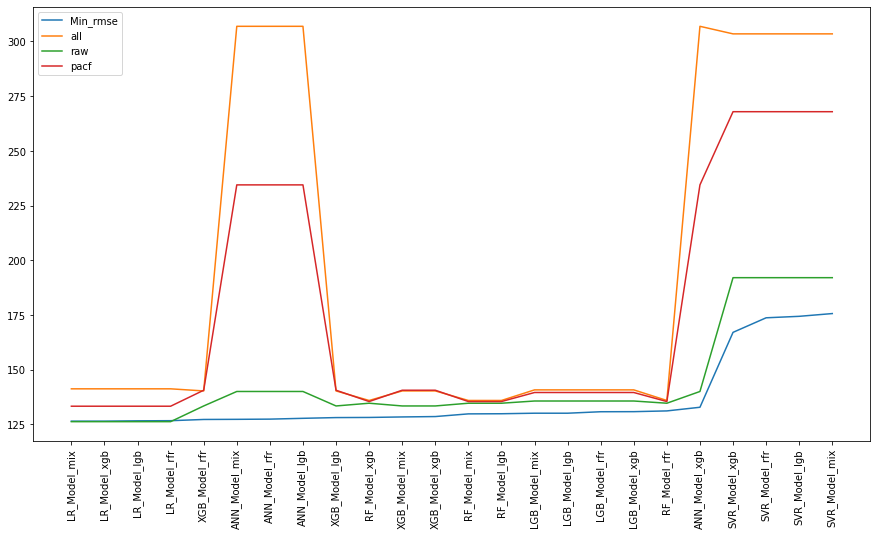

In [148]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/Dow Jones/Compare.png")
plt.show()

### 画图

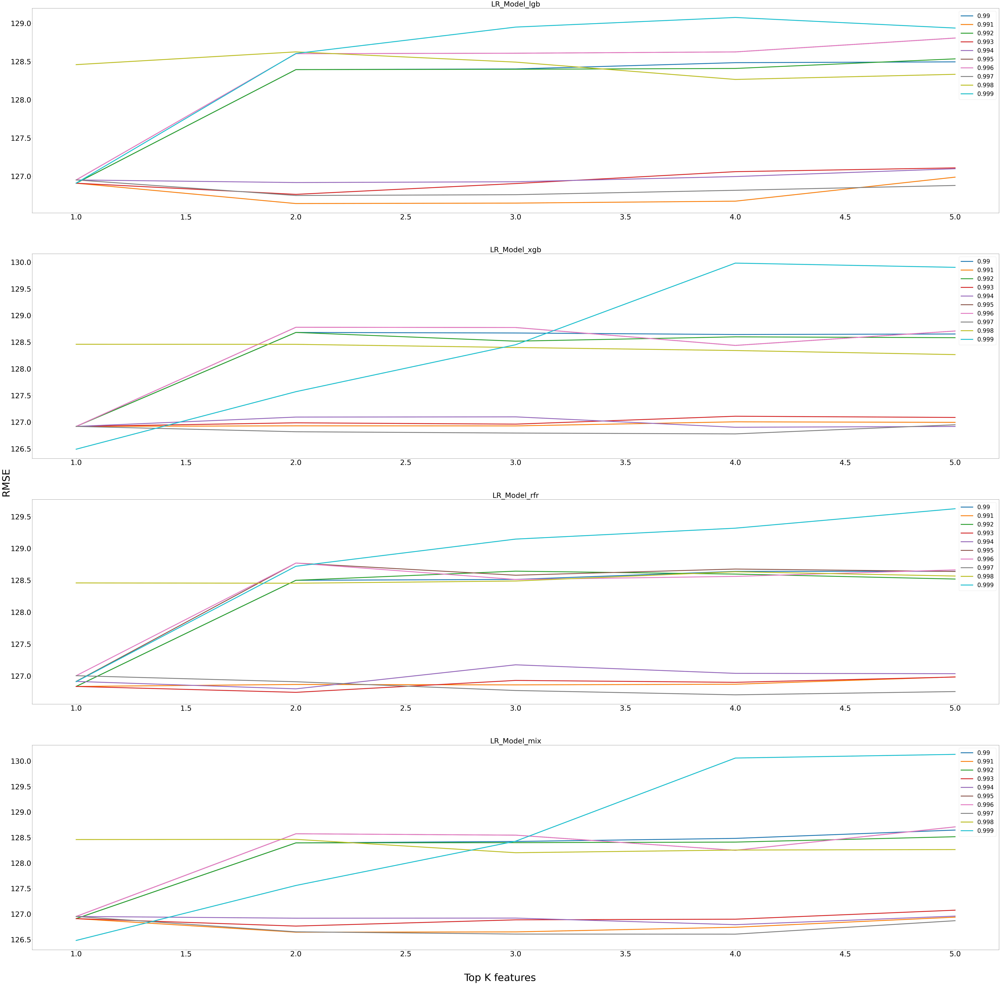

In [98]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/Linear.png')

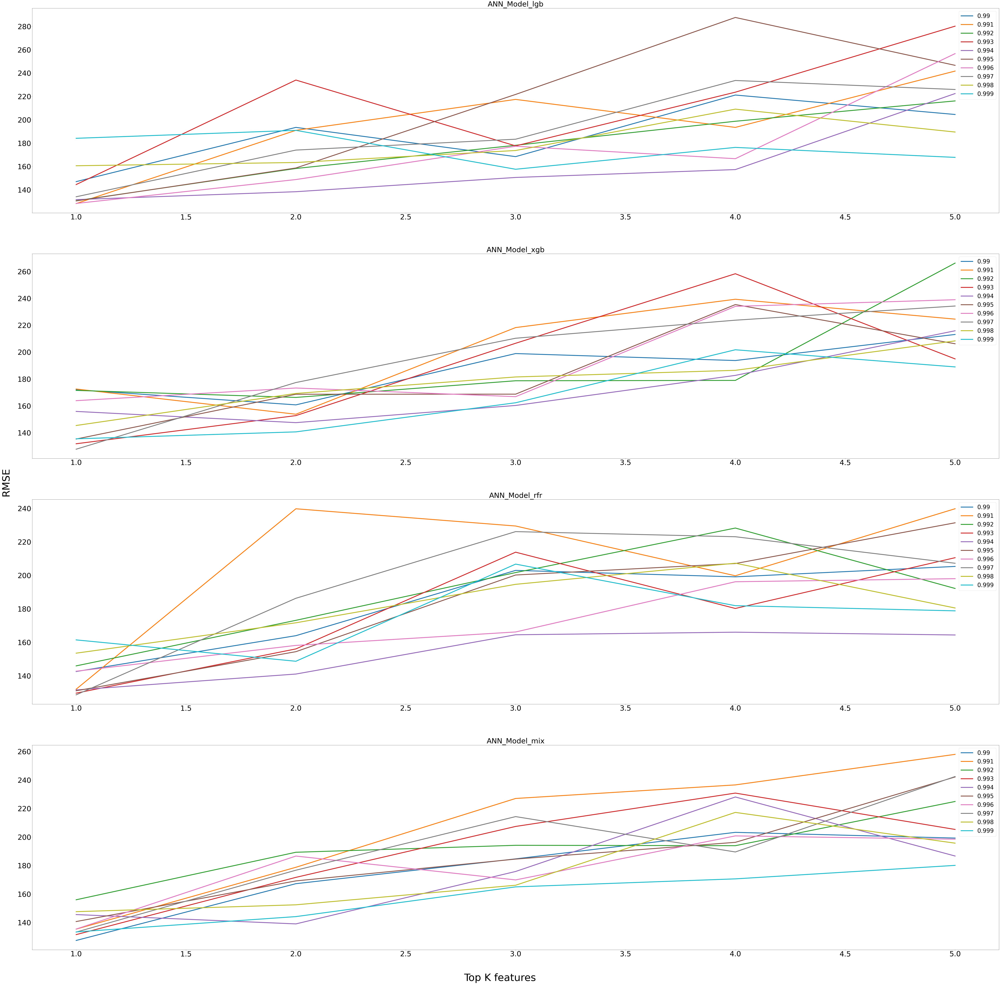

In [99]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/ANN.png')

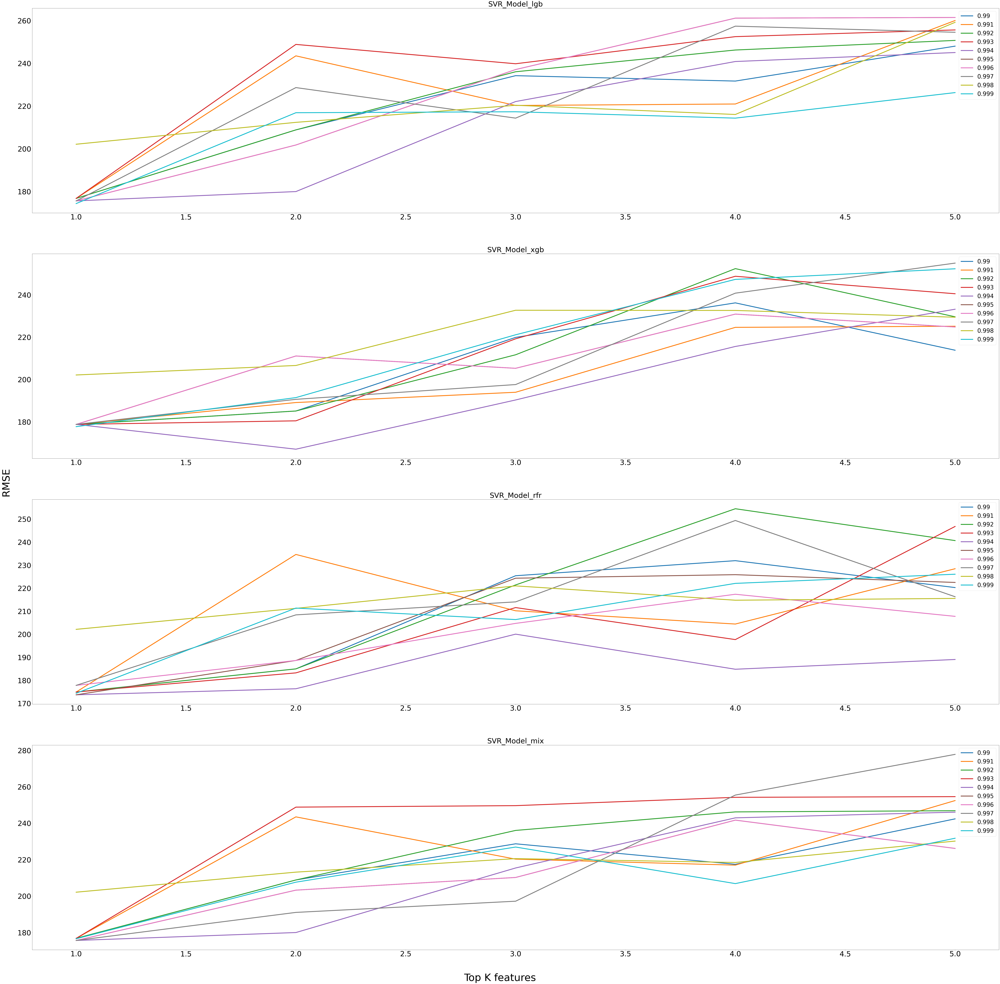

In [100]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/SVR.png')

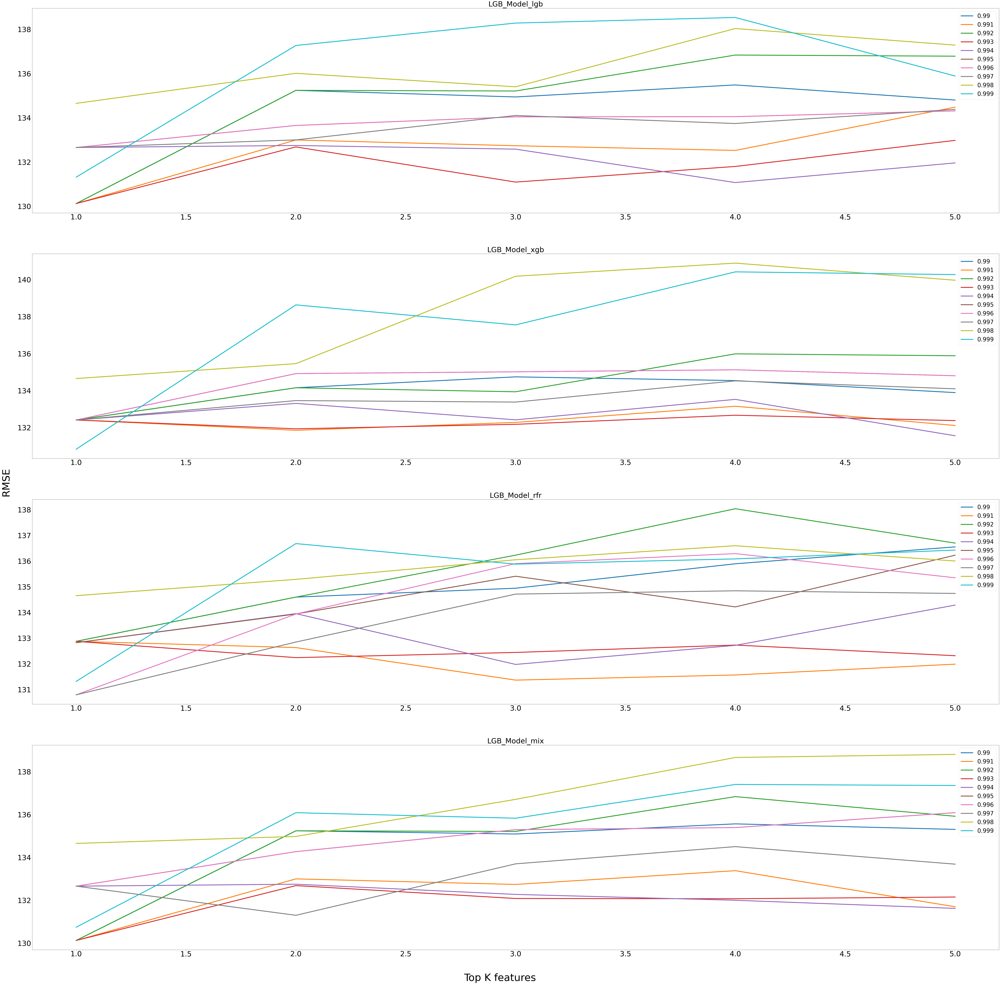

In [101]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/LGB.png')

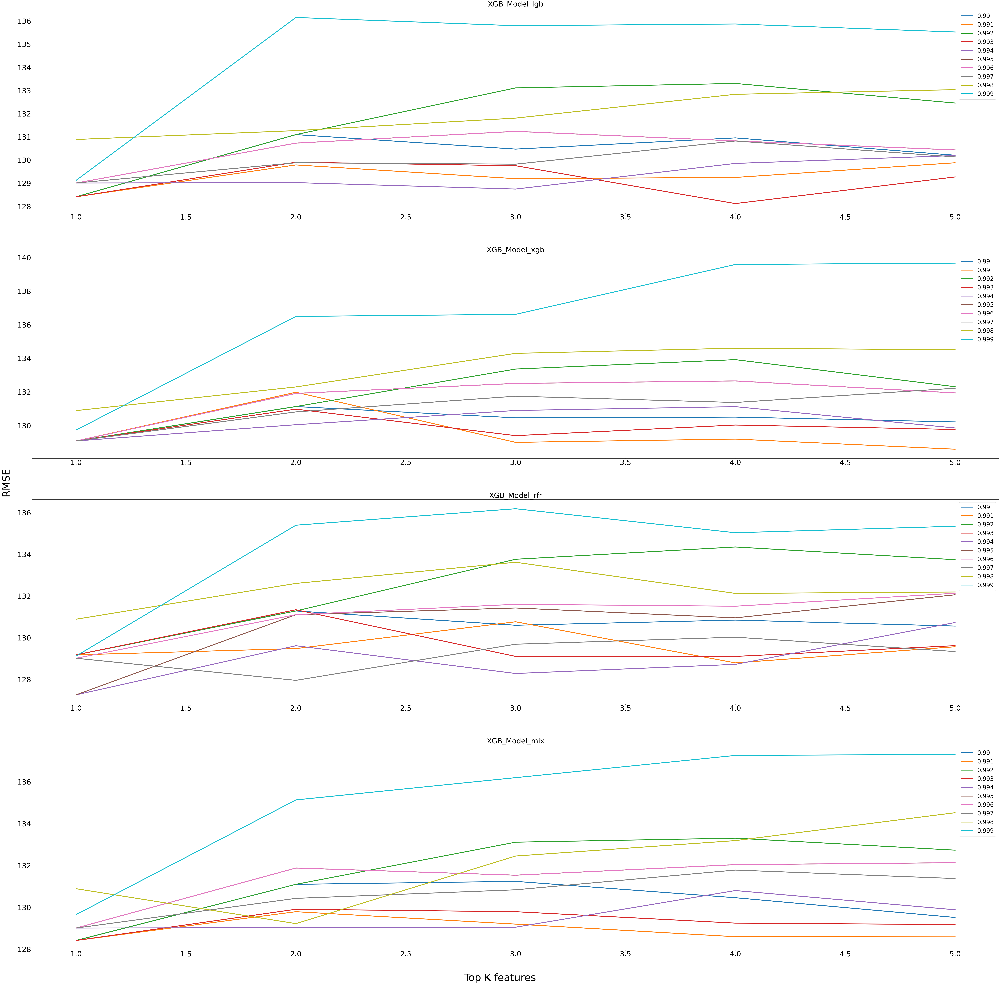

In [102]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/XGB.png')

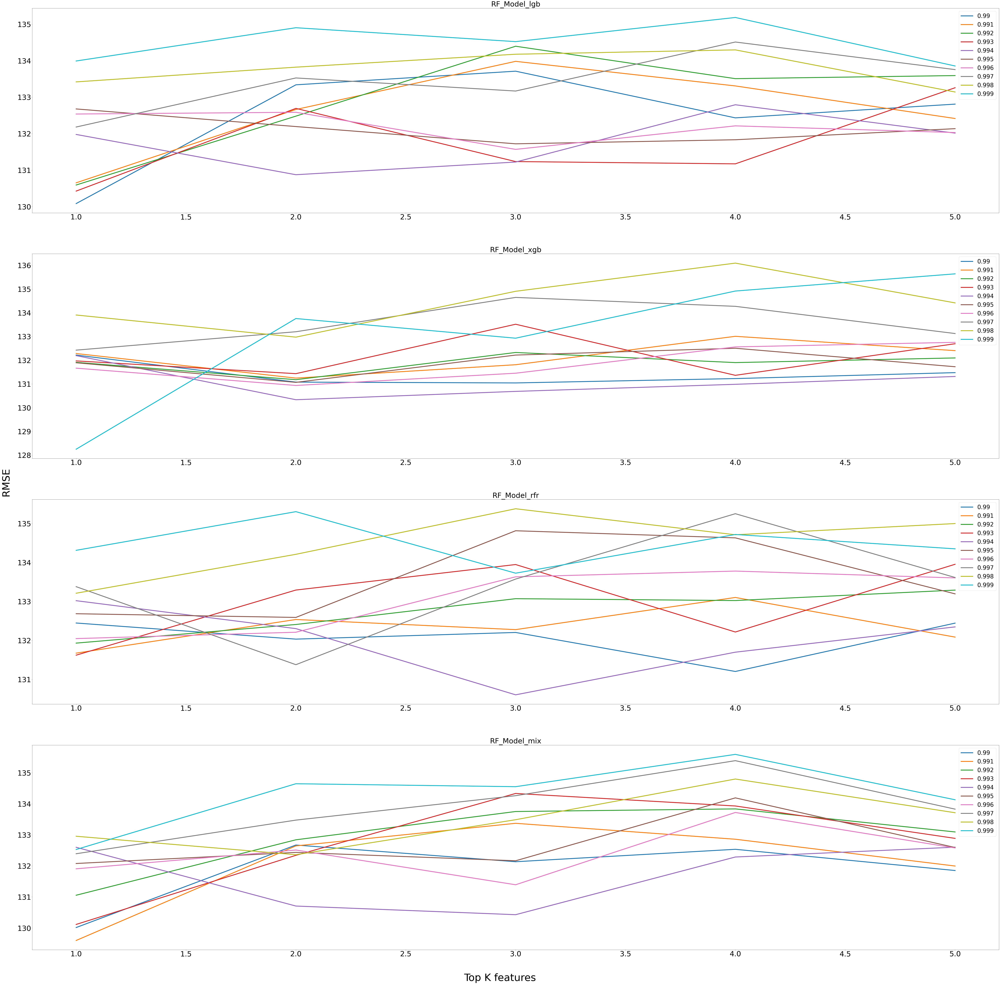

In [103]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Dow Jones/RF.png')

In [115]:
def LR_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )

    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear = reg_Linear.predict(x_test)
    y_Linear_inverse =minmax_y_test.inverse_transform(y_Linear.reshape((-1,1)))
    
    y_df = pd.DataFrame({
        'Actual':y_Linear_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_Linear_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/Dow Jones/Final_prediction.png")
    return y_df

0.9780260963765519


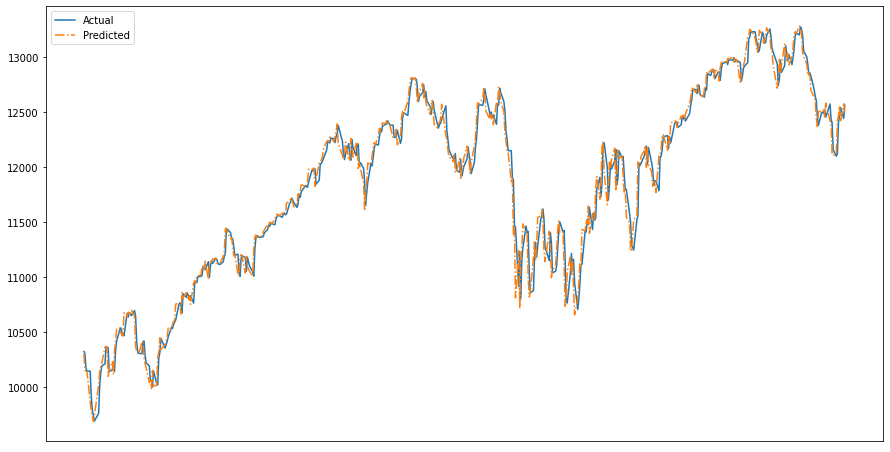

In [117]:
yy = LR_plot(X_train_lag[real_mix[0.999][1]],Y_train_lag,X_test_lag[real_mix[0.999][1]],Y_test_lag)